# Прогнозирование продаж в магазинах офлаин-ритейлера в США <a class="tocSkip">

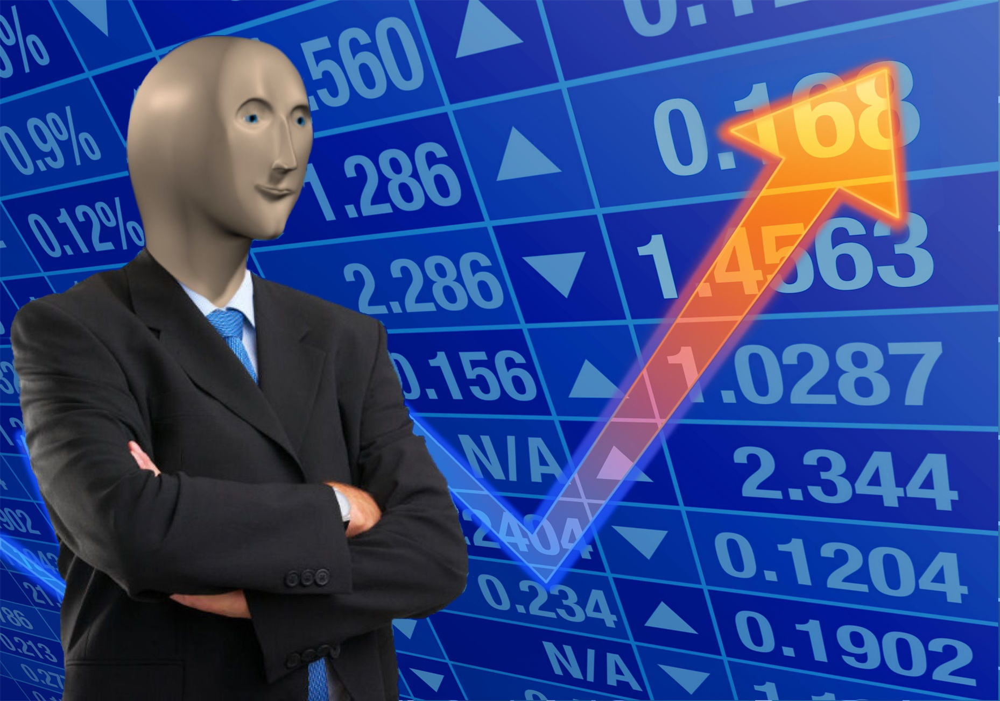

В качестве экзаменационного задания вам предстоит построить модель прогнозирования спроса(продаж) на товары в магазинах офлаин-ритейлера в США . Всего в датасете 3 магазина, в каждом магазине по 15 артикулов (товаров). Вам нужно выбрать 1 магазин (любой из 3).

Прогнозировать продажи нужно на неделю, на месяц и на квартал. Пользоваться сторонними библиотеками с соответствующими реализациями моделей можно.

В качестве дополнительной информации вам переданы данные о цене товара (меняются раз в неделю, а также о праздниках в США).

**Практическое задание 1 - срок к 10.12. Прогнозирование с помощью классических методов.**


**1.1 Реализовать класс для обучения и оценки качества прогноза на неделю, на месяц и на квартал с помощью классических методов:**

1) Должен предобрабатывать исходные данные в удобный формат; 

2) Должен обучаться для задачи прогнозирования; 

3) В качестве моделей должны использоваться классические модели, которые изучали в лекциях 2-5.

4) Должен оценивать качество своих прогнозов;

5) Код должен быть написан по PEP-8;


**1.2 Подготовить отчет в виде jupyter ноутбука:**

1) Все методы должны быть реализованы в классе, в ноутбуке только вызов методов, визуализация и комментарии;

2) Для прогнозов использованы как минимум 3 любые классические модели, которые изучали в лекциях 2-5 

3) Отчет содержит текстовое описание реализованного класса и основных методов, продемонстрирован результат работы этих методов.

4) Отчет содержит визуализации результатов прогнозов и оценки метрик качества на неделю, на месяц и на квартал

5) Отчет содержит текстовые ответы на следующие вопросы:

 * Какие методы предобработки данных вы использовали? Почему пробовали именно их?

 * Какие модели пробовали? Почему пробовали именно их?

 * Как вы проверяете качество модели? На каких данных? Какие метрики используюте? Чем обусловлен выбор именно этих метрик?
 
 * Какая подход из испробованных самый оптимальный с точки зрения качества прогнозирования?

 * Какое итоговое качество модели на тестовом датасете?
 

**Практическое задание 2 - срок к 17.12. Прогнозирование с помощью современных методов.**

**2.1 Реализовать класс для обучения и оценки качества прогноза на неделю, на месяц и на квартал с помощью современных методов:**

**2.2 Подготовить отчет в виде jupyter ноутбука:**


Подпункты 2.1 и 2.2 повторяют полностью подпункты 1.1 и 1.2, кроме единственного исключения - в качестве модели достаточно попробовать только одну - либо градиентный бустинг, либо нейронную сеть, либо обе (по желанию).

**Итоговый проект - срок к 24.12. Реализовать итоговый класс, в котором выбрана 1-2 лучшие по вашему мнению модели, который умеет:** 

1) предобрабатывать исходные данные в удобный формат; 

2) обучаться для задачи прогнозирования; 

3) оценивать качество своих прогнозов;

4) сохранять модели и подгружать их; 

5) Прогнозировать продажи на неделю, на месяц и на квартал.

Должна быть рабочая программа, которая делает инференс (прогнозирование на произвольном тестовом датасете (аналогично тому, который есть у вас)) без обучения (предобученные модели сохранены в файлы и подгружаются в тексте класса)

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import warnings

from sktime.forecasting.fbprophet import Prophet
import logging
import logging
import cmdstanpy
from sktime.forecasting.naive import NaiveForecaster

# Подавление всех логов cmdstanpy
logging.getLogger("cmdstanpy").disabled = True
# Установите уровень логирования в WARNING или ERROR, чтобы не выводить INFO-сообщения
logging.getLogger('prophet').setLevel(logging.WARNING)
warnings.filterwarnings("ignore")
import statsmodels.api as sm
from sktime.forecasting.naive import NaiveForecaster
from scipy import stats

In [12]:
#основные данные
sales = pd.read_csv('models/shop_sales.csv')

Графики продаж артикулов по магазинам:

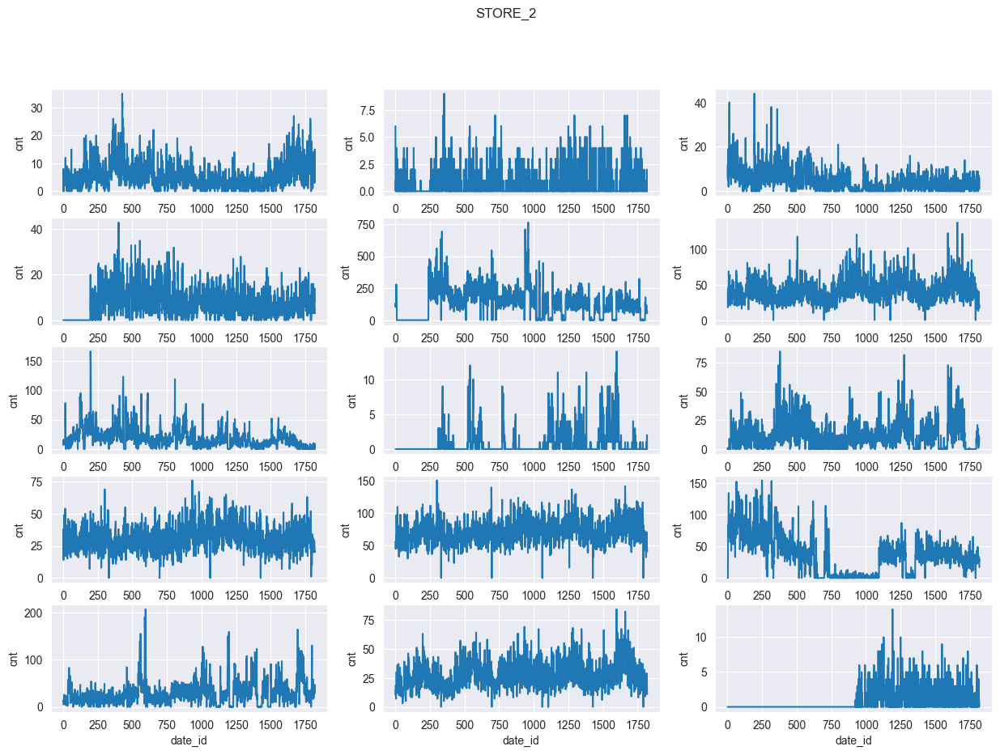

In [13]:
fig,ax = plt.subplots(5,3,figsize=(15,10))

for i, art in enumerate(sales[sales.store_id=='STORE_2'].item_id.unique()):
    sns.lineplot(data = sales[(sales.item_id==art) & (sales.store_id=='STORE_2')],
                 x='date_id',y='cnt',ax = ax[i//3][i%3])
plt.suptitle("STORE_2");

In [231]:
from sktime.performance_metrics.forecasting import MeanAbsoluteError,MeanAbsolutePercentageError
from sklearn.metrics import r2_score
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.model_selection import ExpandingWindowSplitter
from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.arima import AutoARIMA
from scipy.stats import ttest_1samp, shapiro
from statsmodels. tsa.stattools import adfuller, kpss
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from sktime.forecasting.fbprophet import Prophet as prophet_sktime
from sktime.forecasting.model_selection import ForecastingGridSearchCV
from sktime.forecasting.base import ForecastingHorizon
from prophet import Prophet
from scipy import fft
from statsmodels.graphics import tsaplots
from sklearn.ensemble import IsolationForest
from sktime.forecasting.trend import STLForecaster
from statsmodels.tsa.seasonal import STL
from statsforecast import StatsForecast
from statsforecast.models import AutoETS
from sktime.forecasting.statsforecast import StatsForecastAutoARIMA, StatsForecastAutoETS, StatsForecastMSTL
from sktime.transformations.series.boxcox import BoxCoxTransformer
from sktime.forecasting.exp_smoothing import ExponentialSmoothing
from prophet import Prophet


In [98]:
from sktime.transformations.series.boxcox import BoxCoxTransformer
def BC_inverse(y, lam, sig):
    """Back transform Box-Cox with Bias correction.
    See https://robjhyndman.com/hyndsight/backtransforming
    """
    if lam == 0:
        return np.exp(y) * (1 + 0.5 * sig**2)
    else:
        res = np.power(lam*y + 1., 1/lam)
        res *= (1 + 0.5 * sig**2 * (1 - lam) / (lam*y + 1.)**2)
        return res

In [99]:
store = sales[sales.store_id=='STORE_2']
sales_dates = pd.read_csv('models/shop_sales_dates.csv')

In [438]:
class TimeSeriesPredict():
    def __init__(self, store, sales_dates):
        self.store = store
        self.sales_dates = sales_dates
        self.items_names  = self.store.item_id.unique()
        self.h_forecasts =  [7,30,90]
    def get_item_data(self,name):
        """
        Выбирает данные для заданного товара, заменяет индексы на метки времени 
        """
        without_time_index = self.store[(store.item_id==name)]
        without_time_index['date_id'] = without_time_index['date_id'].astype(int)
        merged = without_time_index.merge(self.sales_dates[['date_id', 'date']], how='inner', on='date_id')
        merged.date = merged.date.astype(str)
        merged.date= pd.to_datetime(merged.date)
        merged.set_index('date', inplace=True)
        merged.drop(['store_id', 'item_id', 'date_id'], axis=1, inplace=True)
        merged.columns = ['y']
        return merged 
    def metrics_report(self, y_true,y_pred):
        
        """
        Функция оценки качества прогноза. Оценивает персентили распределения ошибки 
        (медиану, среднее, 3й квартиль и 95-персентиль) 
        по абсолютной и относительной процентной ошибки для прогноза с помощью модели (y_pred) и
        для базового прогноза, равному среднему значению вр.
        
        """
        
        mape_func = MeanAbsolutePercentageError()
        mae_func = MeanAbsoluteError()
        
        y_true_mean = y_true.mean()*np.ones(shape=(len(y_true),))
        
        
        mapes = mape_func.evaluate_by_index(y_true,y_pred)*100
        maes = mae_func.evaluate_by_index(y_true,y_pred)
        
        
        mapes_zero = mape_func.evaluate_by_index(y_true,y_true_mean)*100
        maes_zero = mae_func.evaluate_by_index(y_true,y_true_mean)
        
        def quan_75(y,quan=0.75):
            return y.quantile(quan)
    
        def quan_95(y,quan=0.95):
            return y.quantile(quan)
        
        stats_list = ['mean','median',quan_75,quan_95,'std']
        
        res = pd.DataFrame([maes.agg(stats_list),
                            maes_zero.agg(stats_list),
                            mapes.agg(stats_list),
                            mapes_zero.agg(stats_list)],
                           index=['maes','maes_zero','mapes','mapes_zero'])
        
        #res.loc["r2",:] = r2_score(y_true, y_pred)
        
        return res
    def plot_diagnostics(data, dt_col,resid_col):
        """
        Строим визуальную оценку остатков - остатки as-is, гистограмма остатков, qqplot и автокореляционную функцию.
        """
        
        fig,ax = plt.subplots(2,2,figsize=(15,10))
    
        # resid as-is
        sns.lineplot(data=data, x=dt_col, y=resid_col, ax=ax[0][0]);
        ax[0][0].axhline(0, c="k", linestyle="--")
        ax[0][0].set_title("Динамика ошибок прогноза")
        ax[0][0].set_xlabel(None)
        ax[0][0].set_ylabel(None)
        ax[0][0].xaxis.set_major_locator(plt.MaxNLocator(4))
    
        #hist
        sns.histplot(data=data,x=resid_col,ax=ax[0][1]);
        ax[0][1].set_title("Гистограмма ошибок прогноза")
        ax[0][1].set_xlabel(None)
        ax[0][1].set_ylabel(None)
    
        #acf
        sm.graphics.tsa.plot_acf(data[resid_col], lags=10,ax=ax[1][0]);
        ax[1][0].set_title("Автокореляции ошибок прогноза")
        ax[1][0].set_xlabel(None)
        ax[1][0].set_ylabel(None)
    
        #qq
        qqplot(data[resid_col],line='s',ax=ax[1][1]);
        ax[1][1].set_title("Q-q график ошибок прогноза")
        ax[1][1].set_xlabel(None)
        ax[1][1].set_ylabel(None)
    def test_trend(self, row):
        """Case 1: Both tests conclude that the series is not stationary - The series is not stationary
            Case 2: Both tests conclude that the series is stationary - The series is stationary
            Case 3: KPSS indicates stationarity and ADF indicates non-stationarity - The series is trend stationary. Trend needs to be removed to make series strict stationary. The detrended series is checked for stationarity.
            Case 4: KPSS indicates non-stationarity and ADF indicates stationarity - The series is difference stationary. Differencing is to be used to make series stationary. The differenced series is checked for stationarity.
            """
        kpsstest = kpss(row, regression="c", nlags="auto")
        dftest = adfuller(row, autolag="AIC")
        nonstationary_kpss =  kpsstest[1]<0.05
        nonstationary_df = dftest[1]>0.05
        return nonstationary_kpss | nonstationary_df,  kpsstest[1], dftest[1]
    def prophet_forecaster(self, ts, h_forecast = 7):
        """
        Prophet с перебором параметров на кросс-валидации. Использует преобразование бокса-кокса на случай, если
        нету одной ярко выраженной  сезонности.
        """
        ts_train = ts[:-h_forecast].squeeze()
        # здесь для валидации на длинных отрезках используем 5-7 фолдов
        cv  = ExpandingWindowSplitter(fh = list(range(1,h_forecast)), initial_window=len(ts_train)-(h_forecast*2), step_length=int(h_forecast/6))
        transformer = BoxCoxTransformer(method = "guerrero",sp=7)
        ts_train_box = transformer.fit_transform(ts_train)
        forecaster = prophet_sktime()
        param_grid = {
            "seasonality_mode": ["additive", "multiplicative"],
            "changepoint_prior_scale": [0.05, 0.1, 2.5, 10],
            "seasonality_prior_scale": [1,5,15,20],
            "add_seasonality": [{'name':'weekly', 
                                              'period':7, 
                                              'fourier_order':5}]
        }
        gscv = ForecastingGridSearchCV(
            forecaster=forecaster, 
            param_grid=param_grid,
            cv=cv,
            verbose=1,
            strategy="refit"
        )# по умолчанию подбирает по mape, за это отвечает параметр scoring
        gscv.fit(ts_train_box)
        print(gscv.best_params_)
        print(gscv.best_score_)
        forecaster_final = prophet_sktime(**gscv.best_params_)
        forecaster_final.fit(ts_train_box)
        fh_relative = ForecastingHorizon([i for i in range(1, h_forecast+1)], is_relative=True)
        y_pred = BC_inverse(forecaster_final.predict(fh_relative),transformer.lambda_,ts_train_box.std())
        return  y_pred
    def prophet_forecaster_fourier(self, ts, h_forecast = 7):
        """
        Использует выделение тренда из коробки,  остотчная част рассматривается, как сезонность, моделирутеся фурьями
        """
        ts_train = ts[:-h_forecast].squeeze()
        ts_train = ts_train.reset_index()
        ts_train.columns = ['ds', 'y']
            
        m = Prophet()
        m.fit(ts_train)
        future = m.make_future_dataframe(periods=h_forecast)
        m.get_params()
        # Прогнозирование
        forecast = m.predict(future)
        
        # Извлечение только трендовой компоненты
        trend_forecast = forecast[['ds', 'trend']]
        ts_seasonal = ts_train.y - trend_forecast.trend[:-h_forecast]
        y_pred =  self.fourierExtrapolation(ts_seasonal,h_forecast,800)[-h_forecast:] + trend_forecast.trend[-h_forecast:]
        y_pred.index =  pd.Index(trend_forecast[-h_forecast:].ds)
        return y_pred
    def results_per_model(self, list_df):
        """
        Собирает репорт по метрикам для разных горизнтов прогнозирования, берёт mapes
        и медиану. Строит новый сводный отчёт
        
        """
        interested_metrics = [(     'mapes',    'mean'),(     'mapes',    'median')]
        columns = []
        for tup in interested_metrics:
            columns.append(f"{tup[0].strip()}_{tup[1].strip()}")
        values_pivot = []
        for df  in list_df:
            values_pivot.append(df.stack().loc[interested_metrics].values)
        combined_array = np.vstack(values_pivot)
        return pd.DataFrame(combined_array,columns = columns, index = [5,30,90])
    def estimate_envelope(self, forecaster, ts):
        predicts = [] 
        reports = []
        for h in self.h_forecasts:
            y_pred  = forecaster(ts,h)
            report =  self.metrics_report(ts[-h:].values, y_pred.values )
            predicts.append(y_pred)
            reports.append(report)
        for y_pred in predicts:
            plt.plot(y_pred.index, y_pred.values)
        plt.plot(ts[-90:].index, ts[-90:].values, c = "black", label = "fact")
        plt.legend()
        plt.show()
        cumulative_report = self.results_per_model(reports)
        print(cumulative_report)
    def fourierExtrapolation(self,x_orig, n_predict, n_harm = 20, inner_freq = 1.0):
        """
        Функция для экстраполяции рядов Фурье. По вр х делает предикт на n_predict шагов
        с помощью частот с наибольшей амплитудой
        Возвращает исходный ряд + экстраполяцию на n_predict шагов
        
        https://gist.github.com/tartakynov/83f3cd8f44208a1856ce
        """
        n_orig = x_orig.size
        n = n_orig - len(x_orig) % 7 
        t = np.arange(0, n)
        x =  x_orig.iloc[:n]
        x_freqdom = fft.fft(x,axis=0)  # x in frequency domain
        f = fft.fftfreq(n,inner_freq)              # frequencies
        indexes = list(range(n))
        indexes.sort(key=lambda i: np.absolute(x_freqdom[i]), reverse = True )
        
        t = np.arange(0, n_orig + n_predict)
        restored_sig = np.zeros(t.size)
        for i in indexes[:1 + n_harm]:
            ampli = np.absolute(x_freqdom[i]) / n   # amplitude
            phase = np.angle(x_freqdom[i])          # phase
            restored_sig += ampli * np.cos(2 * np.pi * f[i] * t * inner_freq  + phase)
        return restored_sig
    def es_forecaster(self,ts,h_forecast= 7):
        ts.index = pd.PeriodIndex(ts.index,freq='D')
        ts_train = ts[:-h_forecast]
        param_grid = {
            "sp": [7, 365, "auto"],
            "seasonal": ["add", "mul"],
            "trend": ["add", "mul"],
            "damped_trend": [True, False],
        }
        cv  = ExpandingWindowSplitter(fh = list(range(1,h_forecast)), initial_window=len(ts_train)-(h_forecast*2), step_length=int(h_forecast/6))
        forecaster = ExponentialSmoothing()
        
        gscv = ForecastingGridSearchCV(
            forecaster=forecaster, 
            param_grid=param_grid,
            cv=cv,
            verbose=1,
            strategy="refit"
        )
        gscv.fit(ts_train)
        forecaster_final = ExponentialSmoothing(**gscv.best_params_)
        forecaster_final.fit(ts_train.squeeze())
        fh_relative = ForecastingHorizon([i for i in range(1, h_forecast+1)], is_relative=True)
        y_pred = forecaster_final.predict(fh_relative)
        y_pred.index = y_pred.index.to_timestamp()
        ts.index = ts.index.to_timestamp()
        return y_pred
    def stl_arima_forecaster(self,ts, h_forecast = 7):
        """
        STL для разбиения на компоненты. Для прогнозирования сезонности и остатков используются
        фурье и автоарима, трендовая компонента прогнозируется наивно 
        :param ts: 
        :param h_forecast: 
        :return: y_pred
        """
        ts.index = pd.PeriodIndex(ts.index,freq='D')
        ts_train = ts[:-h_forecast]
        m = STLForecaster(sp = 7, forecaster_trend=NaiveForecaster(strategy="drift") ,forecaster_resid=AutoARIMA(suppress_warnings=True))
        fh = list(range(1, h_forecast+1))
        m.fit(ts_train)
        y_pred =  m.forecaster_trend_.predict(fh = fh)
        y_pred+=m.forecaster_resid_.predict(fh = fh).values
        y_pred+=self.fourierExtrapolation(m.seasonal_,h_forecast,800)[-h_forecast:]
        y_pred.index = y_pred.index.to_timestamp()
        ts.index = ts.index.to_timestamp()
        return y_pred
    def ets_forecaster(self, ts, h_forecast = 7):
        ts.index = pd.PeriodIndex(ts.index,freq='D')
        ts_train = ts[:-h_forecast]
        model = StatsForecastAutoETS()
        model.fit(ts_train)
        y_pred = model.predict(fh=np.arange(1, h_forecast + 1))
        y_pred.index = y_pred.index.to_timestamp()
        ts.index = ts.index.to_timestamp()
        return y_pred
    def baseline_filter(self, ts):
        """
        Базовая обработка временного ряда. Убирает последовательность нулей в самом начале, так как некоторые ряды
        имеют по 200-300 с начала отсчёта. IForest-ом  находит выбросы, заменяет их на медиану соседних. Поднимает
        ряд на 1, чтобы нормально считалось MAPE на кросс-валидации, и в будущем для других метрик
        """
        first_date_null = None
        last_date_null = None
        k = 0
        for date in ts.index:
            if  ts.loc[date,"y"] ==0 and first_date_null == None:
                first_date_null = date
                k+=1
            elif  ts.loc[date,"y"] ==0:
                k+=1
            elif ts.loc[date,"y"] != 0 and first_date_null != None:
                last_date_null = date
                break
        ts_f = ts.copy()
        if k> 100:
            ts_f = ts.loc[last_date_null:] 
        
        ts_f = ts_f +1 #поднимем на единицу, чтобы mape нормально считалась везде
        window_size = 3  
        rolling_median = ts_f.rolling(window=window_size, min_periods=1).median()
        model = IsolationForest(contamination=0.05)
        outliers = model.fit_predict(ts_f)
        outliers = outliers == -1
        ts_f[outliers] = rolling_median[outliers]
        return ts_f
    def fourier_analysis(self, ts,inner_freq = 1):
        fft_values = fft.fft(ts,axis=0)
        N = len(ts)
        freq_values = fft.fftfreq(N, inner_freq)
        indexes = list(range(N))
        # sort indexes by frequency, lower -> higher
        indexes.sort(key=lambda i: np.absolute(fft_values[i]), reverse = True )
        leak_step =  max(indexes[1:])
        plt.plot(freq_values[:N//2], np.abs(fft_values[:N//2]), label= f"Year")
        plt.legend()
        return round(1/np.abs(freq_values[leak_step]))
    def primary_analysis(self, ts_original):
        """
        Рисует исходный ряд, предобработанный  baseline_filter
        Приводит спектр фурье по неделям, по годам. Рисует ACF и PCF
        :param ts_original: 
        :return: 
        """
        fig, ax = plt.subplots(3, 2, figsize=(20, 16))
        ts = self.baseline_filter(ts_original)
        
        ax[0][0].plot(ts_original.index, ts_original.y, label='Original TS')
        ax[0][0].legend()

        ax[0][1].plot(ts.index,  ts.y, label='Preprocessed TS')
        ax[0][1].legend()

        inner_freq = 1/365
        fft_values = fft.fft(ts_original.y,axis=0)
        N = len(ts)
        freq_values = fft.fftfreq(N, inner_freq) 
        ax[1,1].plot(freq_values[:N//2][:10], np.abs(fft_values[:N//2][:10]), label= f"Year")
        ax[1,1].set_title("Фурье спектр")
        ax[1,1].legend()
        
        inner_freq = 1/7
        fft_values = fft.fft(ts_original.y,axis=0)
        N = len(ts)
        freq_values = fft.fftfreq(N, inner_freq) 
        
        ax[1,0].plot(freq_values[:N//2], np.abs(fft_values[:N//2]), label= f"Weeks")
        ax[1,0].set_title("Фурье спектр")
        ax[1,0].legend()
        tsaplots.plot_acf(ts.dropna(),ax=ax[2,0],lags =40);
        tsaplots.plot_pacf(ts.dropna(),ax=ax[2,1],lags =40);
        plt.show()
        print(self.test_trend(ts))
    def run_pipeline(self, item_name):
        ts = self.get_item_data(item_name)
        self.primary_analysis(ts)
        ts_treated = tsp.baseline_filter(ts)
        print(f"Item: {item_name}")
        print("--------------Prophet from box--------------")
        tsp.estimate_envelope(tsp.prophet_forecaster,ts_treated)
        print("--------------Prophet trend + Fourier--------------")
        tsp.estimate_envelope(tsp.prophet_forecaster_fourier,ts_treated)
        print("--------------Stl + Fourier + Arima--------------")
        tsp.estimate_envelope(tsp.stl_arima_forecaster,ts_treated)
        """
        print("--------------Exponential Smoothing--------------")
        tsp.estimate_envelope(tsp.es_forecaster,ts_treated)
        """
        print("--------------Auto ets--------------")
        tsp.estimate_envelope(tsp.ets_forecaster,ts_treated)
        

В качестве целевой метрики выбрана MAPE и MAPE медианная, так как наиболее интерпретируема
Далее использованы модели: 
1) Prophet с подбором гиперпараметров на кросс-валидации
2) Prophet выделяющий тренд, для моделирования сезонности используется фурье
3) STL декомпозиция. Остатки моделируется автоаримой, сезонность фурье, тренд форекастится наивно
4) AutoETS

Там далее ещё будут приводится таблички с метриками. В первой строке результаты прогноза на 7 дней, а не на 5. Описался

In [436]:
tsp = TimeSeriesPredict(store, sales_dates)


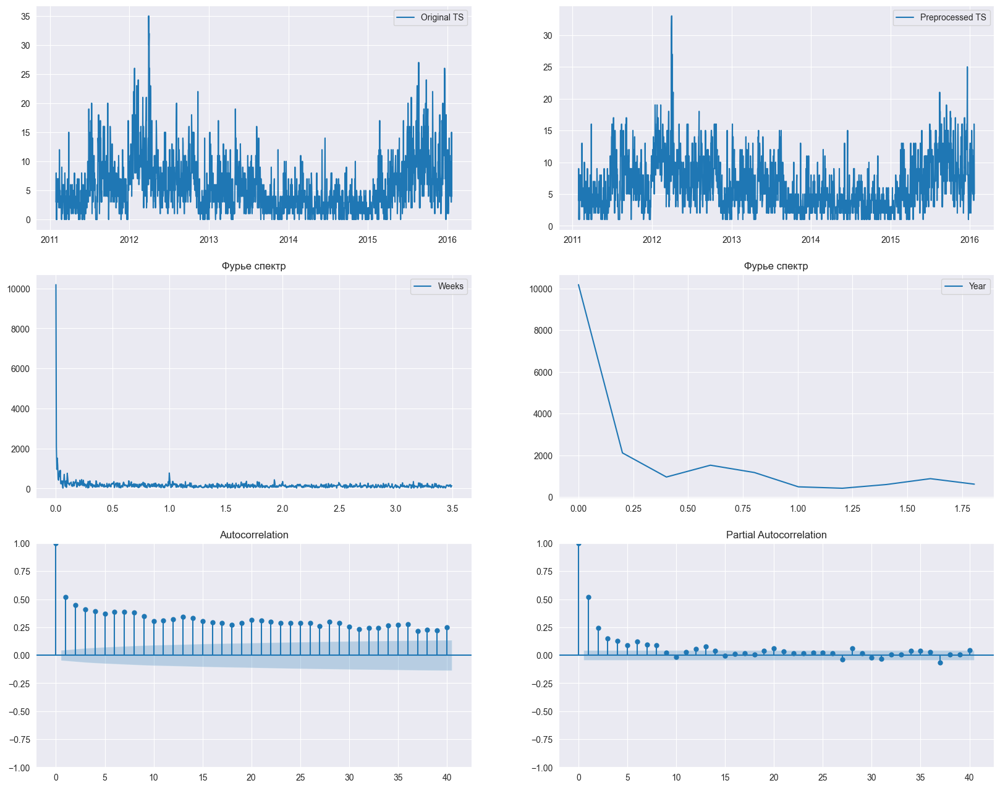

(True, 0.014527581510773512, 1.3230985243242627e-05)
Item: STORE_2_085
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
0.6491390668048355
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
0.3306513171587287
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 20}
40632480129163.99


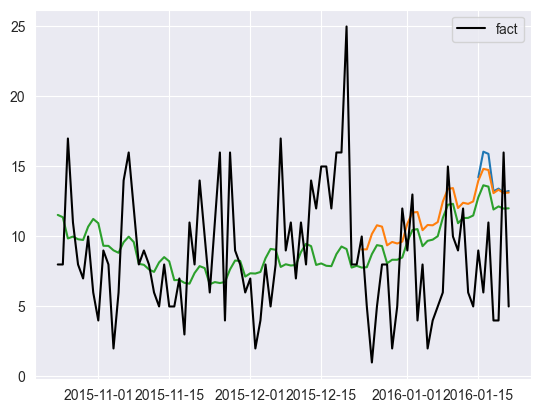

    mapes_mean  mapes_median
5   131.299411    165.028758
30  132.572300     85.790225
90   66.439849     35.961661
--------------Prophet trend + Fourier--------------


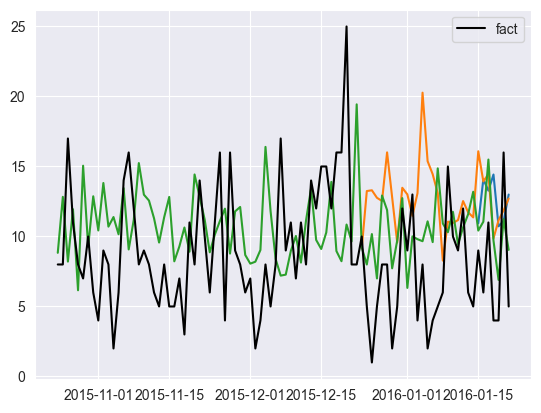

    mapes_mean  mapes_median
5   113.747134    134.771386
30  165.341684     97.777840
90   82.867622     44.896966
--------------Stl + Fourier + Arima--------------


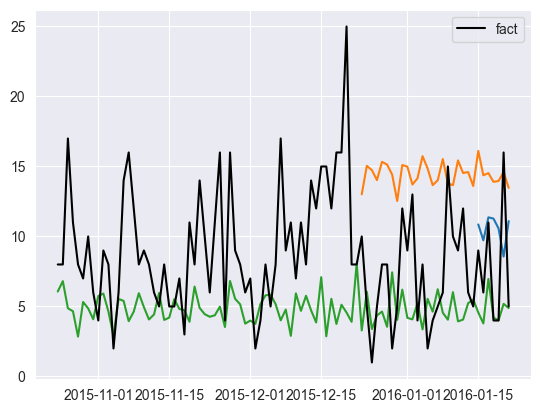

    mapes_mean  mapes_median
5    85.844035     62.103385
30  192.930658    141.440560
90   48.961172     44.826434
--------------Auto ets--------------


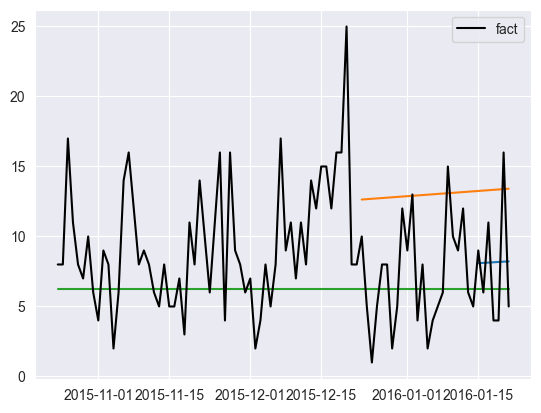

    mapes_mean  mapes_median
5    56.141574     48.740972
30  164.445997    118.857057
90   48.775744     30.902608


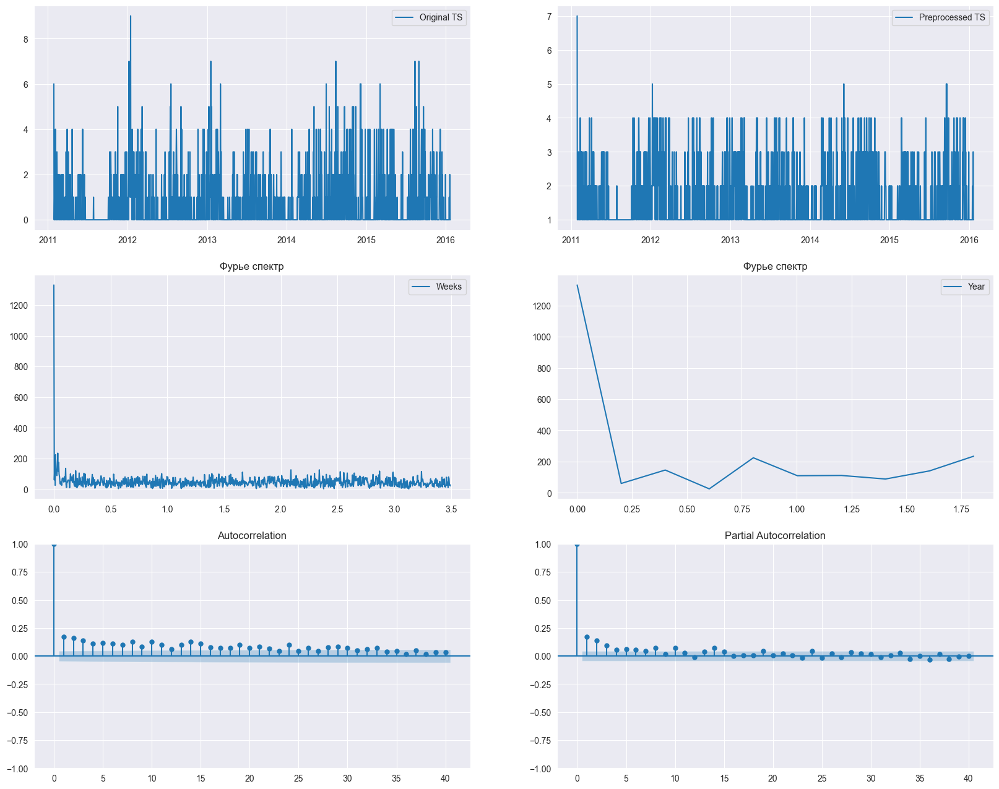

(False, 0.1, 1.4144879607750064e-09)
Item: STORE_2_043
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
1273858561864248.5
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
766964977253861.0
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 20}
570502071010181.2


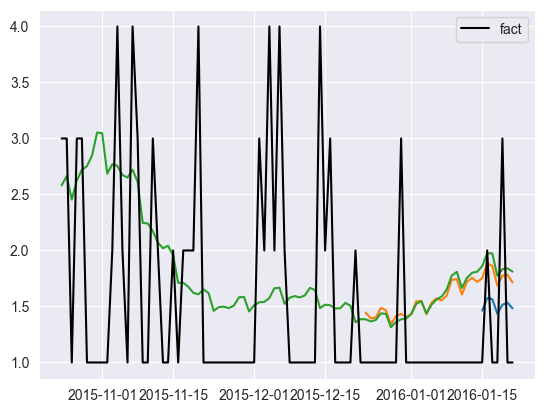

    mapes_mean  mapes_median
5    45.560165     48.284779
30   55.465833     54.700708
90   60.202615     51.355270
--------------Prophet trend + Fourier--------------


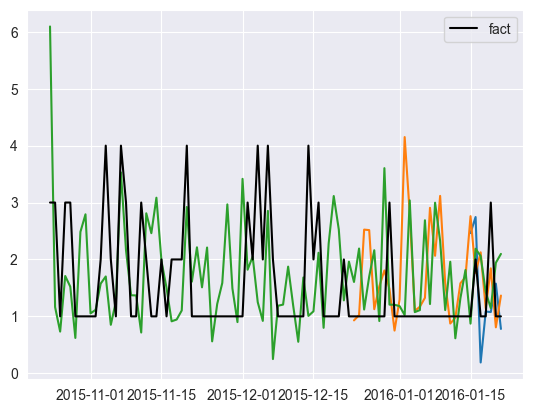

    mapes_mean  mapes_median
5    59.550410     57.519703
30   74.614498     44.545622
90   68.216547     49.577531
--------------Stl + Fourier + Arima--------------


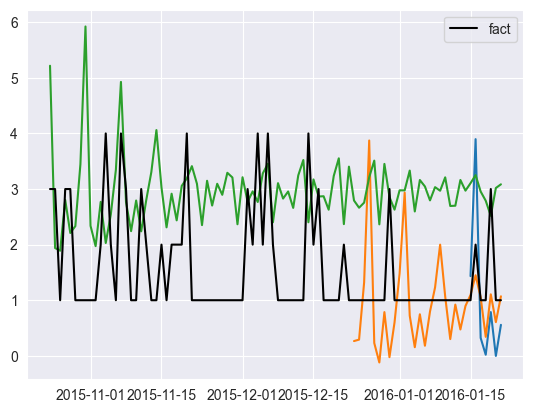

    mapes_mean  mapes_median
5    74.616601     73.783058
30   59.477389     43.827224
90  145.625599    170.132400
--------------Auto ets--------------


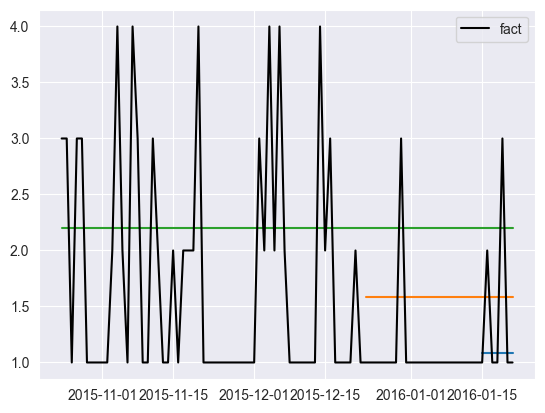

    mapes_mean  mapes_median
5    21.623747      8.327894
30   56.149216     58.108767
90   88.826465    120.123115


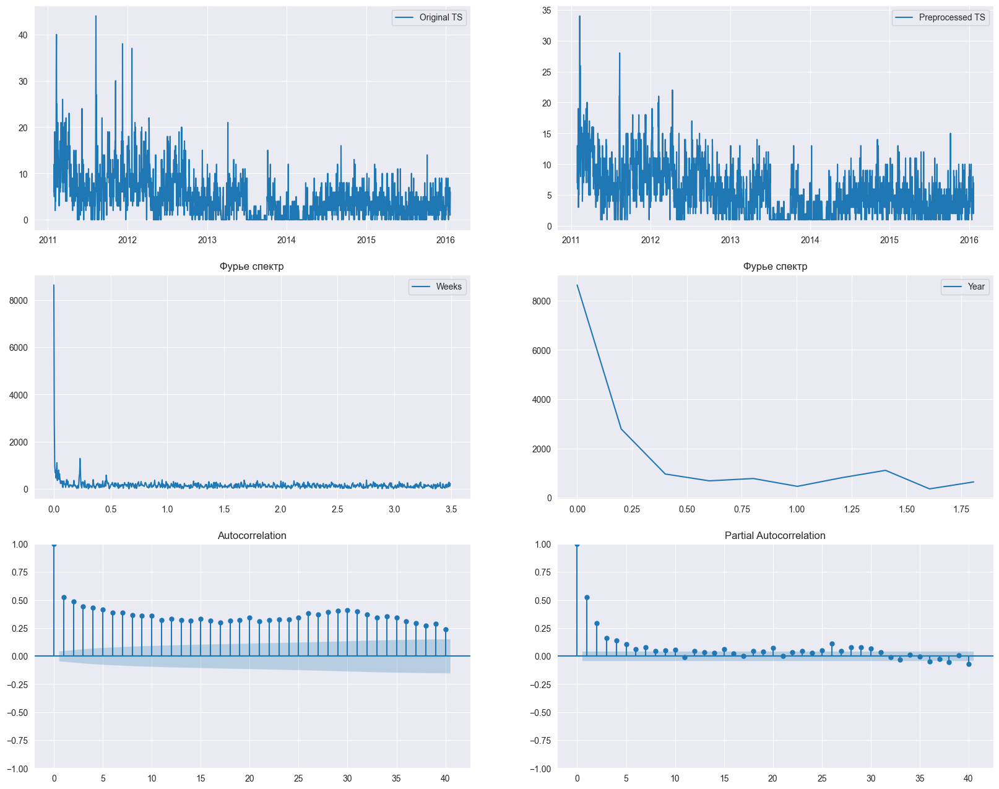

(True, 0.01, 0.01434756972006181)
Item: STORE_2_054
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
259221587879763.88
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 15}
847773235434352.2
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 15}
1330165770381216.2


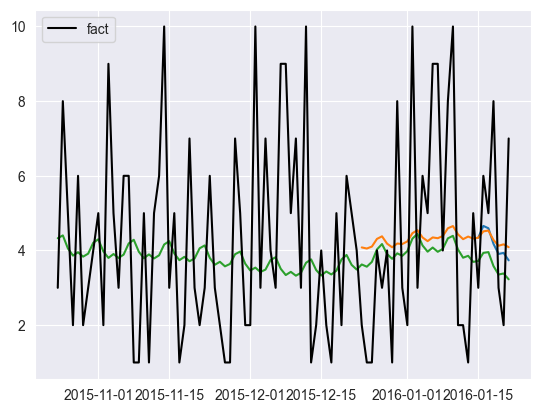

    mapes_mean  mapes_median
5    42.373018     44.777928
30   84.816127     47.077417
90   75.508422     46.454638
--------------Prophet trend + Fourier--------------


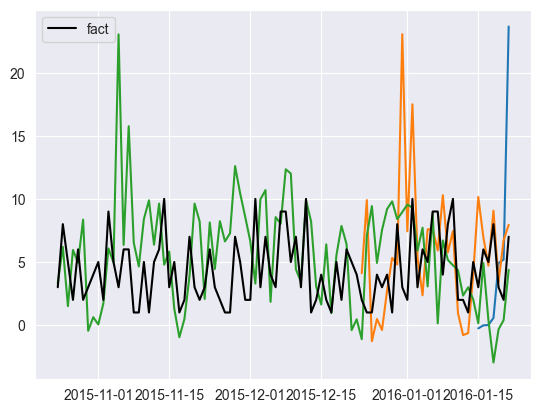

    mapes_mean  mapes_median
5   123.297181    100.336415
30  143.612457     67.802567
90  159.730015     80.144398
--------------Stl + Fourier + Arima--------------


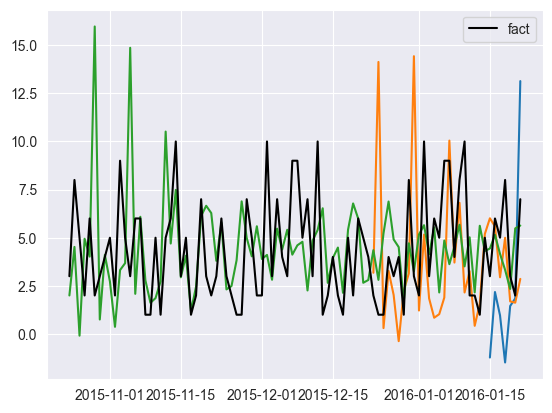

    mapes_mean  mapes_median
5    78.664994     80.762935
30  105.328828     57.582346
90   91.474821     46.441816
--------------Auto ets--------------


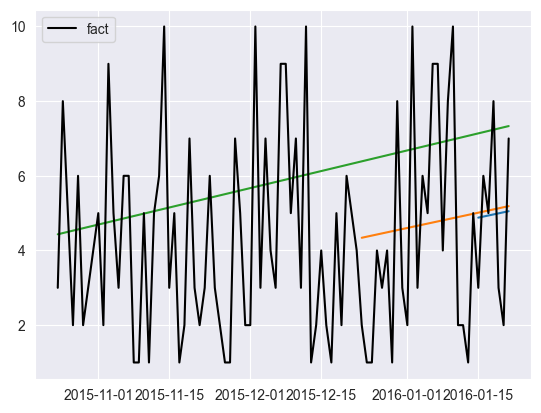

    mapes_mean  mapes_median
5    52.215947     37.927427
30   94.886178     49.957154
90  128.385041     56.592963


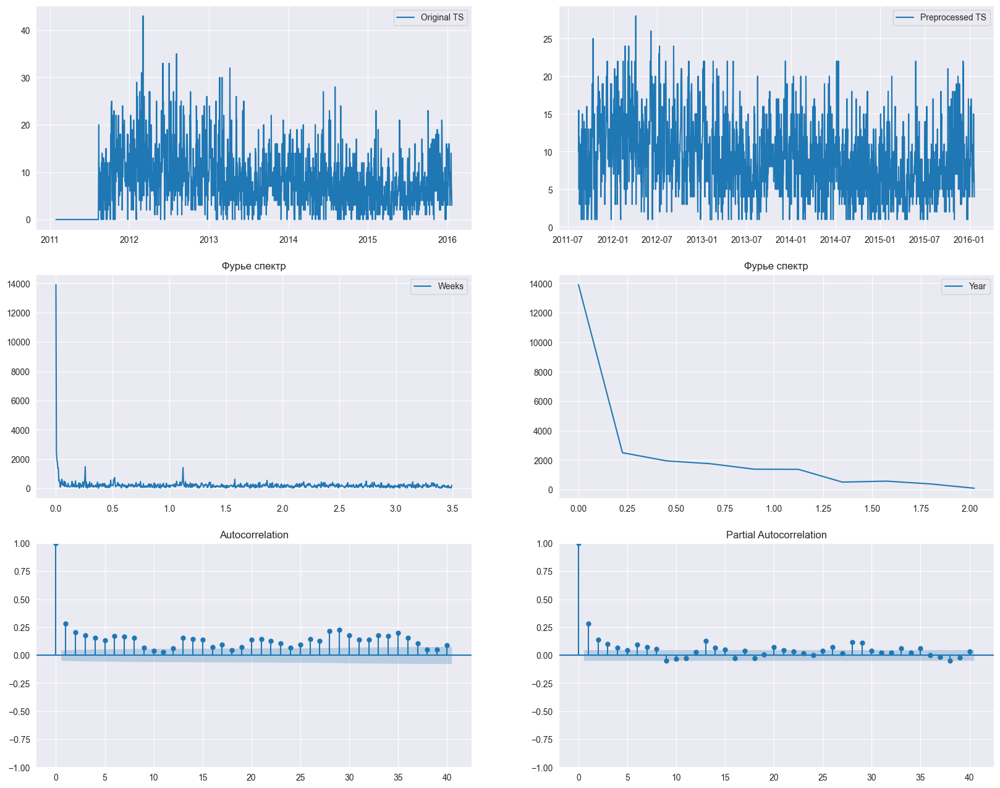

(True, 0.01, 0.00026763136729331127)
Item: STORE_2_325
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 15}
0.3425313884709517
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
153434366602604.66
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 20}
420505554063502.1


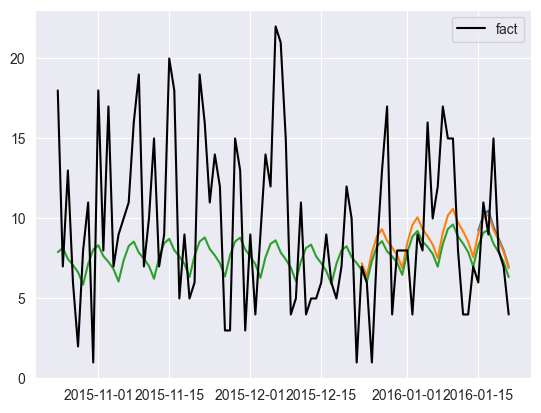

    mapes_mean  mapes_median
5    30.463109     16.624930
30   58.866422     25.044309
90   62.440649     35.336494
--------------Prophet trend + Fourier--------------


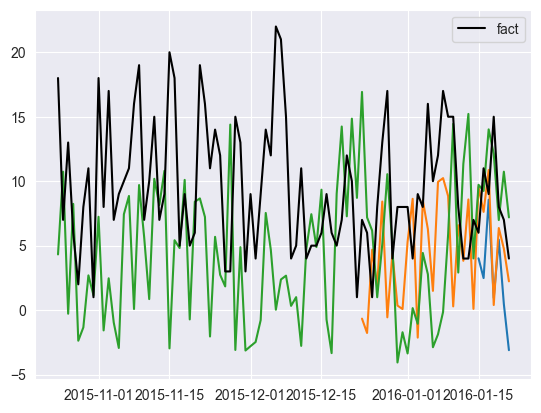

    mapes_mean  mapes_median
5    73.108945     77.388372
30   72.970168     59.939135
90   94.787548     76.582860
--------------Stl + Fourier + Arima--------------


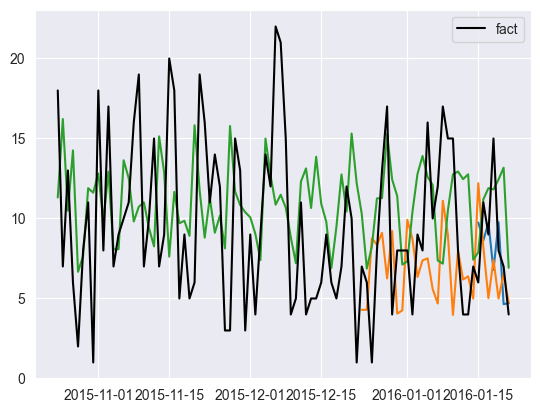

    mapes_mean  mapes_median
5    31.464315     22.018208
30   69.389415     42.112070
90   93.683280     39.676871
--------------Auto ets--------------


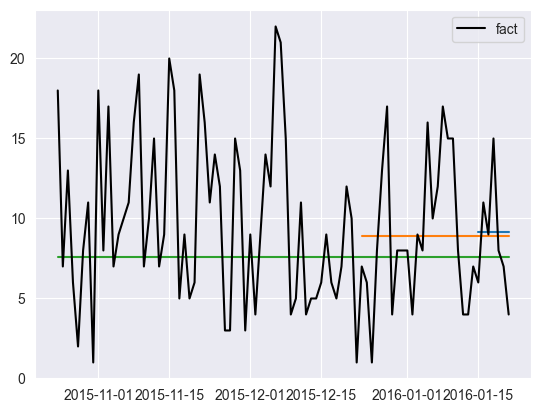

    mapes_mean  mapes_median
5    40.484888     30.618031
30   67.250509     29.417262
90   65.070280     41.703638


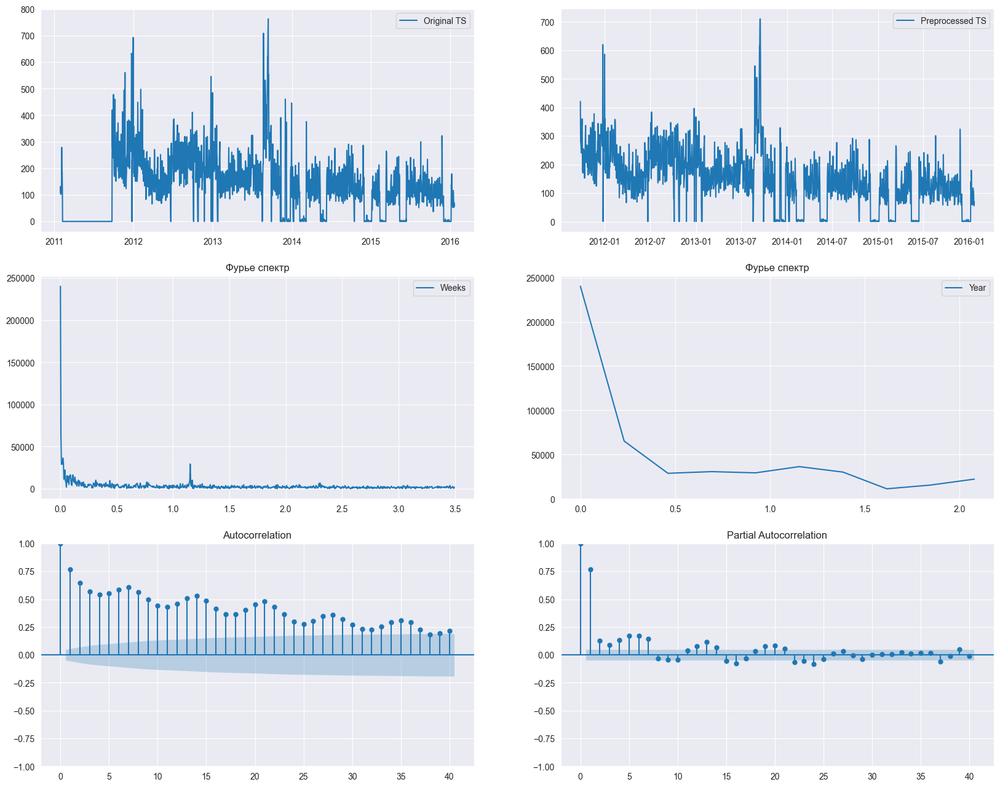

(True, 0.01, 0.0006276208460689619)
Item: STORE_2_090
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
1.0599236942560142e+16
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1}
9750103973603306.0
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1}
6265885290338184.0


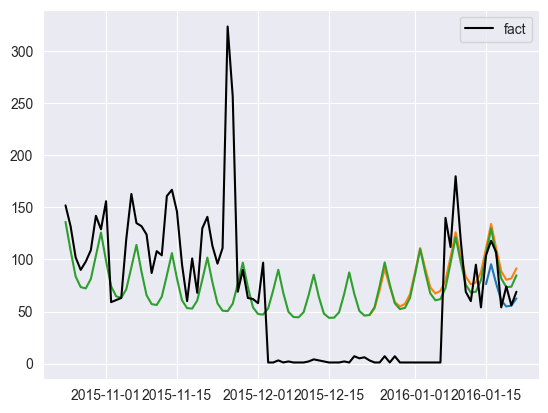

     mapes_mean  mapes_median
5     17.399928     19.112957
30  3010.463807    404.170833
90  1816.618667     47.250785
--------------Prophet trend + Fourier--------------


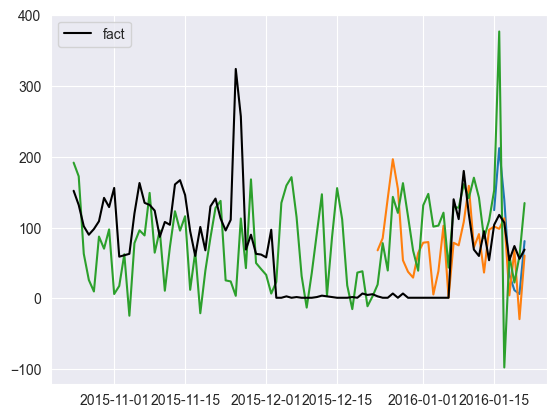

     mapes_mean  mapes_median
5     51.181096     37.891062
30  2897.154683    122.022465
90  2386.962877     89.909651
--------------Stl + Fourier + Arima--------------


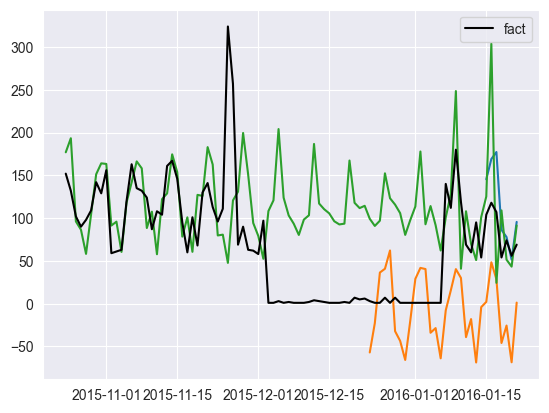

     mapes_mean  mapes_median
5     37.191451     39.779779
30  1794.399554    352.738629
90  3122.423830     66.943871
--------------Auto ets--------------


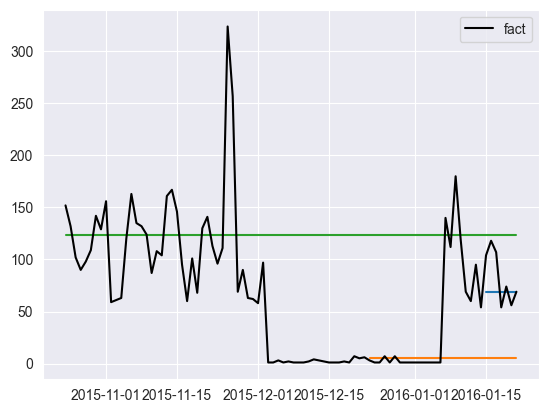

     mapes_mean  mapes_median
5     24.093597     28.175568
30   225.983995     95.462790
90  3556.924629     95.795312


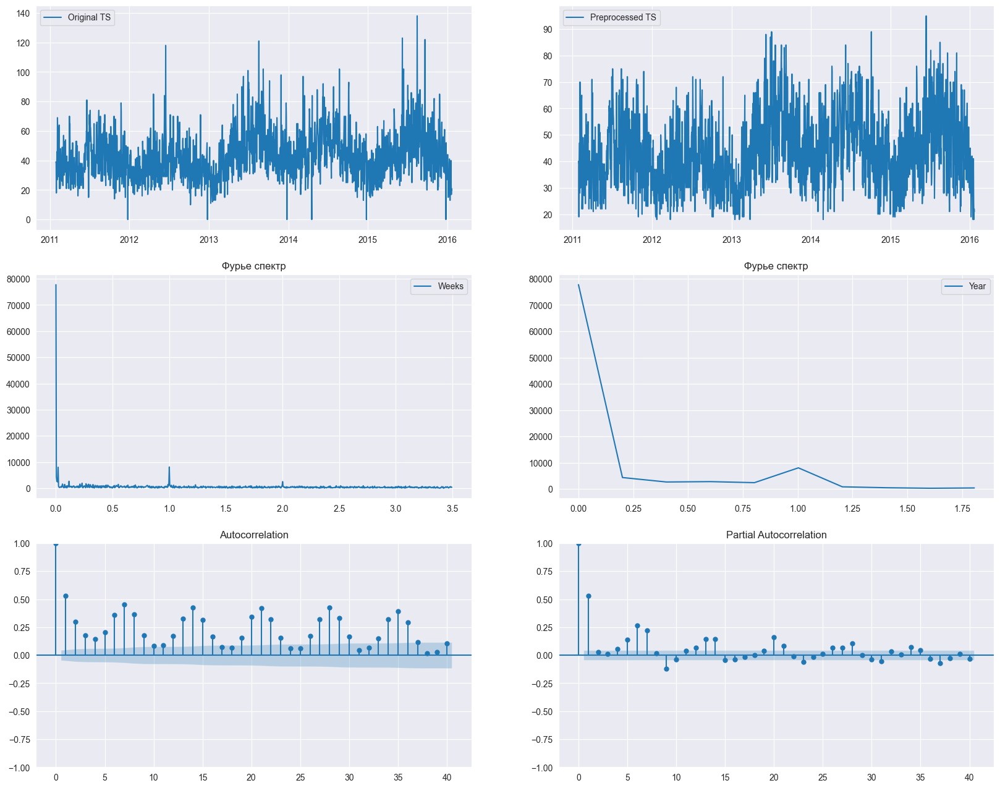

(True, 0.01, 0.005767473481193512)
Item: STORE_2_252
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
0.08697517038013619
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
0.07952045083264363
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 2.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
0.10071175313053642


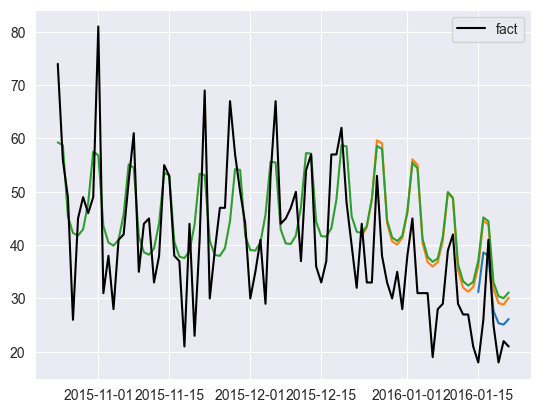

    mapes_mean  mapes_median
5    31.325382     24.511566
30   37.070188     31.283063
90   25.414106     19.214855
--------------Prophet trend + Fourier--------------


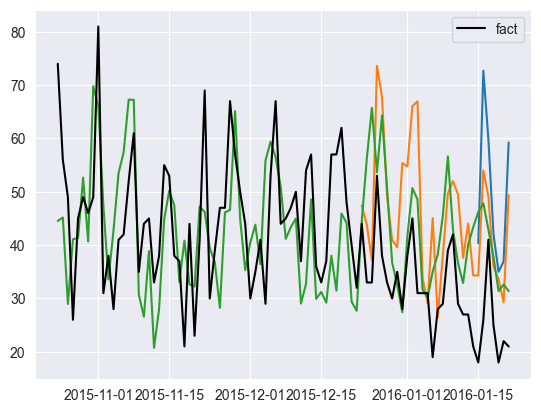

    mapes_mean  mapes_median
5   108.953163     94.466328
30   52.261263     41.701224
90   31.462474     25.047487
--------------Stl + Fourier + Arima--------------


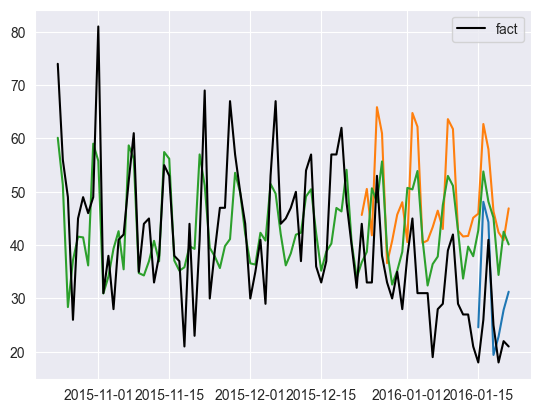

    mapes_mean  mapes_median
5    36.352190     26.885135
30   64.099916     53.653212
90   27.422374     17.983658
--------------Auto ets--------------


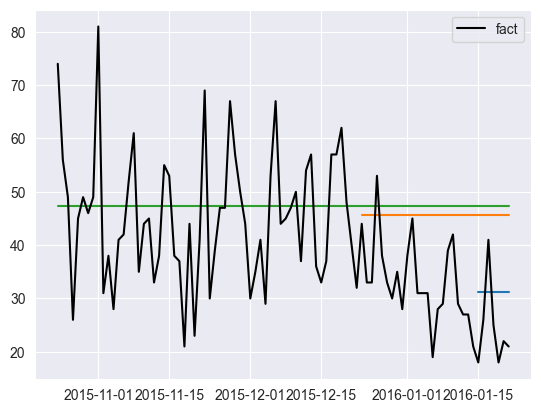

    mapes_mean  mapes_median
5    43.549292     41.657371
30   58.645115     49.600933
90   38.597792     24.711360


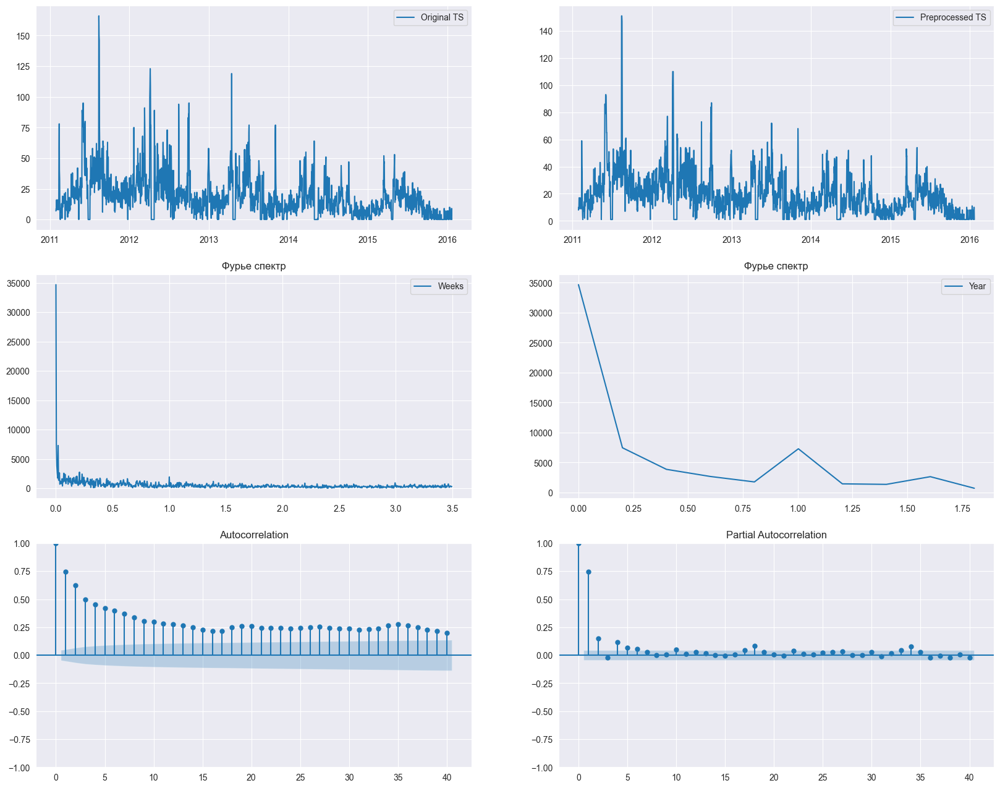

(True, 0.01, 1.6762657304466897e-06)
Item: STORE_2_376
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
1480305663939894.8
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 2.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
2683604631223800.5
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 20}
437367318012446.5


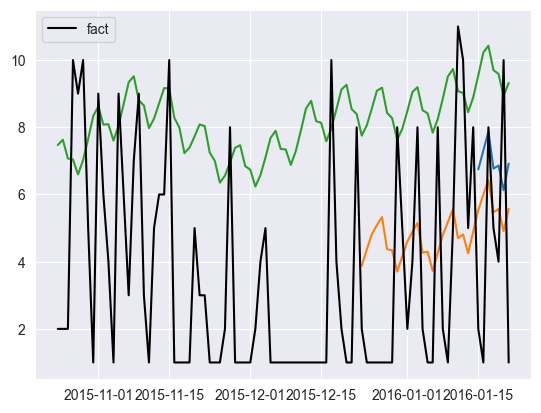

    mapes_mean  mapes_median
5   229.641942     71.562360
30  177.699742    103.698154
90  365.081599    284.492976
--------------Prophet trend + Fourier--------------


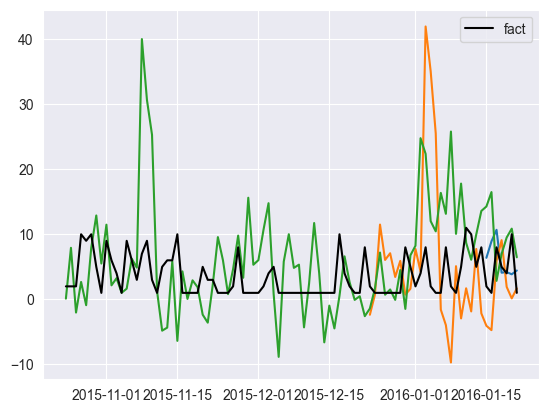

    mapes_mean  mapes_median
5   210.308324     61.450278
30  375.683856    188.331880
90  311.920130    166.979879
--------------Stl + Fourier + Arima--------------


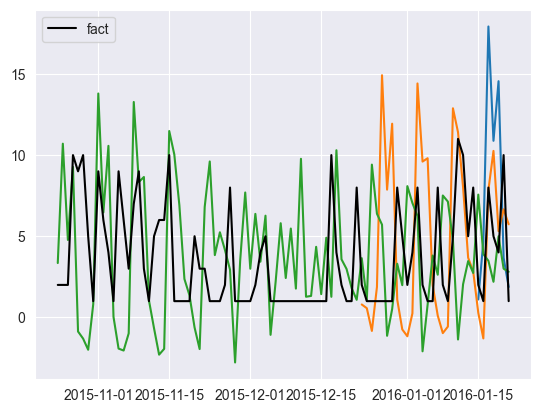

    mapes_mean  mapes_median
5   153.004705    117.599907
30  235.931626     98.445966
90  192.207936    116.191351
--------------Auto ets--------------


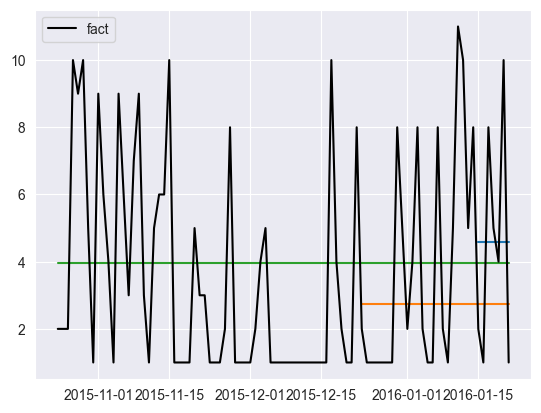

    mapes_mean  mapes_median
5   138.368878     54.039478
30   96.717176     65.642832
90  157.014423     98.330767


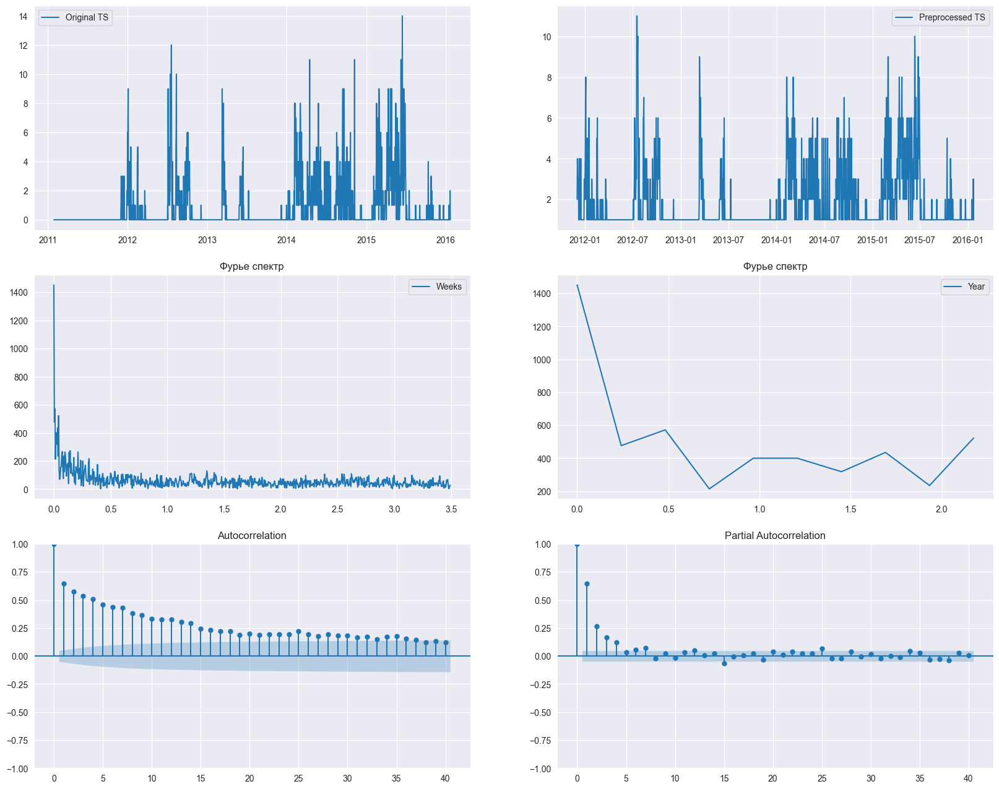

(False, 0.08613887214351822, 1.9113849442552637e-09)
Item: STORE_2_391
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 15}
23712611492692.7
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 2.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 5}
19528721691247.285
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 15}
1592362366413843.5


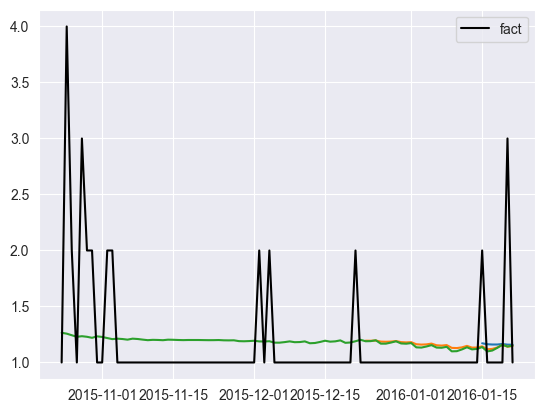

    mapes_mean  mapes_median
5    26.217356     16.309546
30   18.398233     16.054223
90   21.632317     19.256479
--------------Prophet trend + Fourier--------------


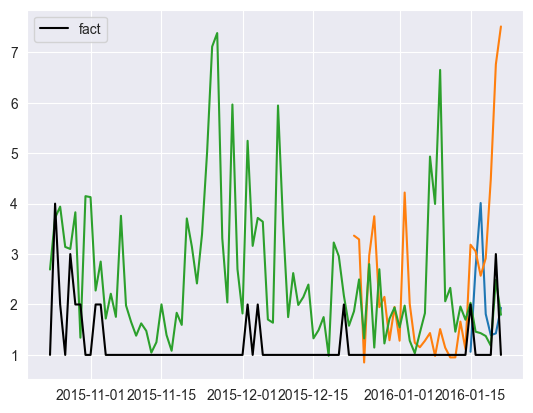

    mapes_mean  mapes_median
5   112.389457     81.077334
30  124.733161     80.334463
90  133.484707     84.693684
--------------Stl + Fourier + Arima--------------


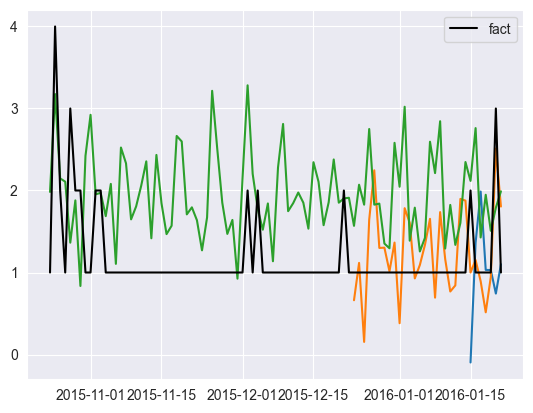

    mapes_mean  mapes_median
5    47.324270     36.262621
30   43.243569     33.741945
90   84.781418     82.569582
--------------Auto ets--------------


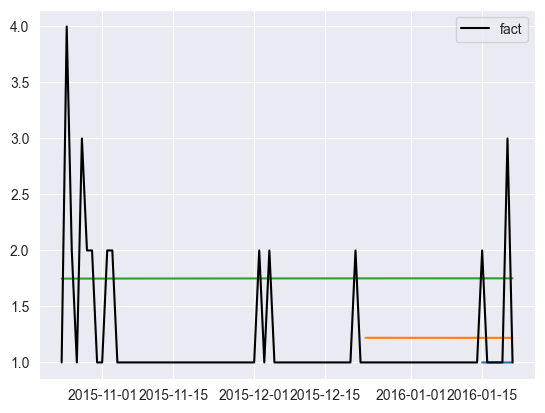

    mapes_mean  mapes_median
5    16.692569      0.036280
30   23.783281     21.969519
90   67.819124     75.017345


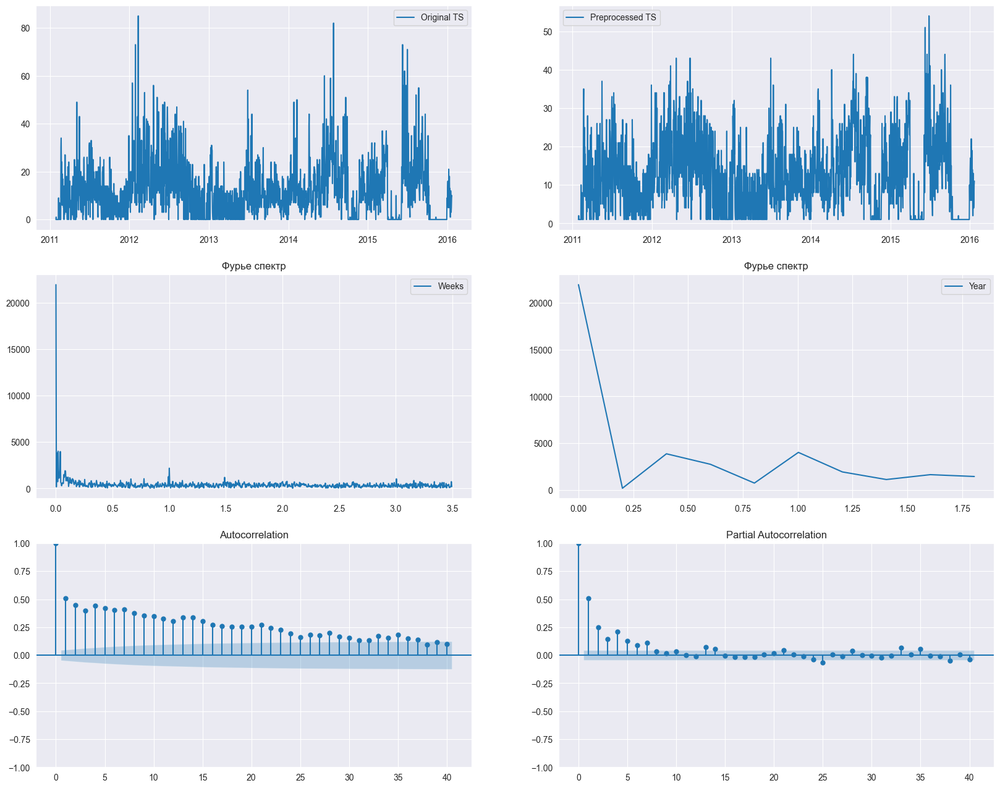

(False, 0.1, 6.294554906277751e-06)
Item: STORE_2_524
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1}
0.3160535686639651
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 15}
6742176224540521.0
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 20}
514176274559322.7


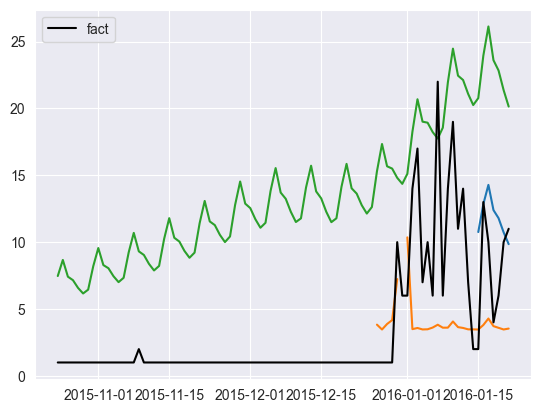

    mapes_mean  mapes_median
5   115.163525     42.828261
30   94.853170     71.679377
90  801.389544    902.427947
--------------Prophet trend + Fourier--------------


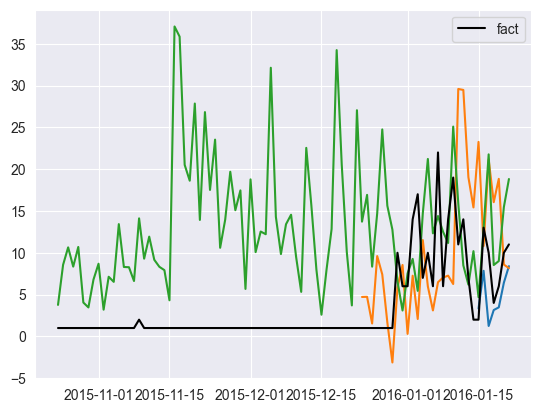

    mapes_mean  mapes_median
5    45.234703     39.660304
30  210.721892     79.149851
90  951.485567    745.188164
--------------Stl + Fourier + Arima--------------


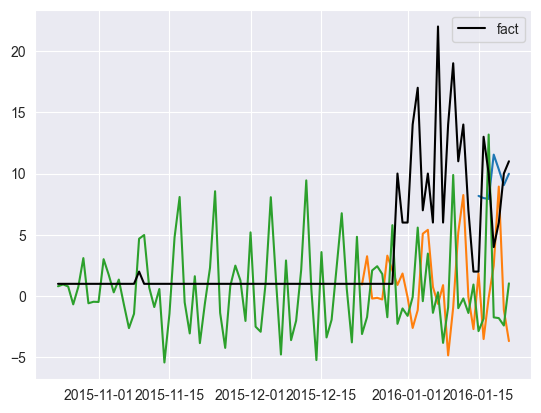

    mapes_mean  mapes_median
5    92.505384     38.482667
30  100.114082    102.315403
90  224.275732    147.142270
--------------Auto ets--------------


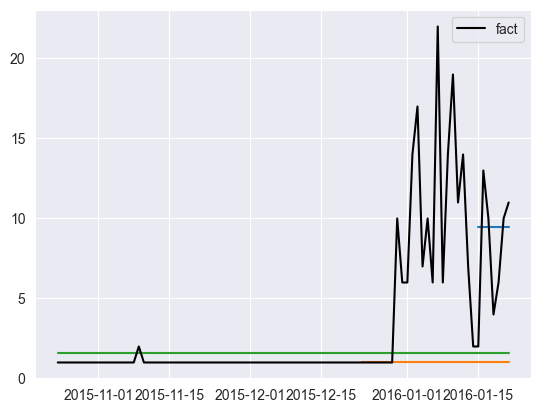

    mapes_mean  mapes_median
5    88.545009     27.144204
30   65.336942     84.523522
90   61.824976     57.231693


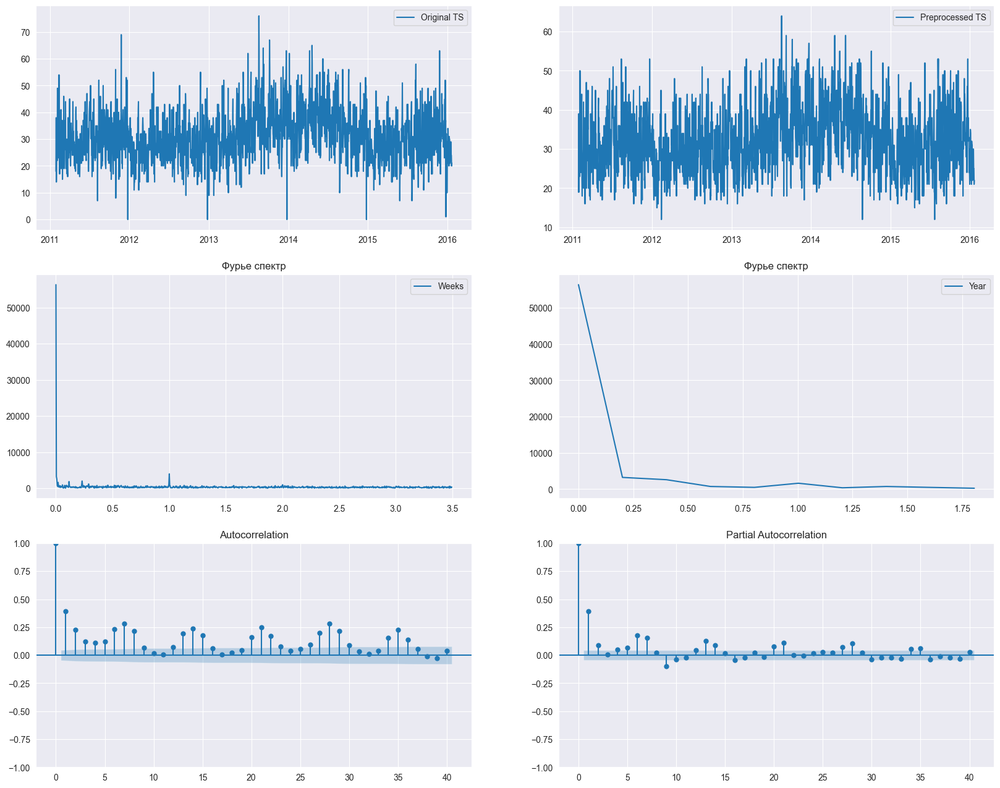

(True, 0.01, 3.6839196861422177e-06)
Item: STORE_2_555
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1}
0.06047032487270984
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 5}
0.0768555054933273
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
0.11671470724050811


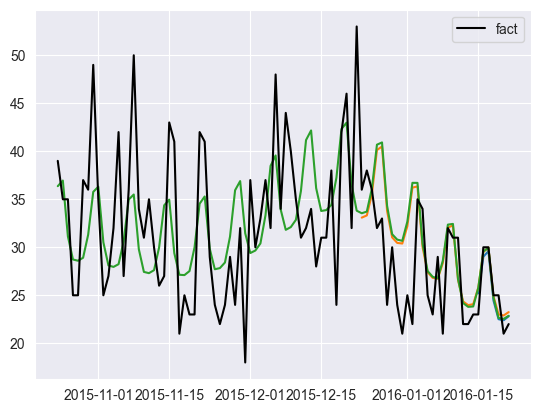

    mapes_mean  mapes_median
5     5.233997      3.698116
30   14.780792      9.320547
90   16.996925     13.577383
--------------Prophet trend + Fourier--------------


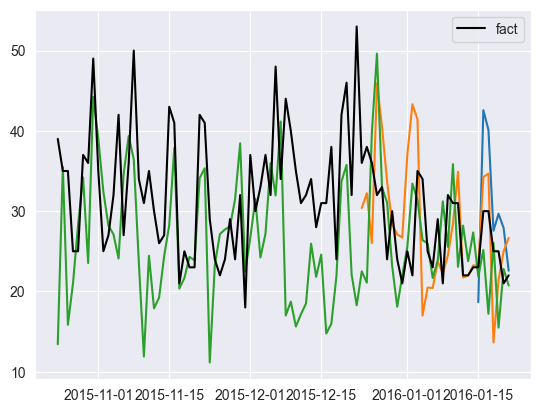

    mapes_mean  mapes_median
5    22.722952     18.932467
30   21.832207     16.849490
90   24.610872     22.195589
--------------Stl + Fourier + Arima--------------


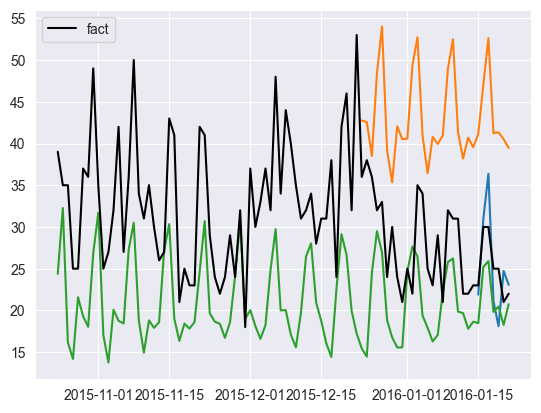

    mapes_mean  mapes_median
5    13.585536     15.571491
30   60.521180     64.335816
90   30.999985     30.480203
--------------Auto ets--------------


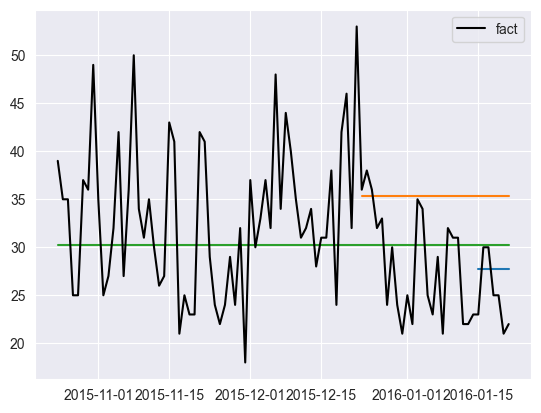

    mapes_mean  mapes_median
5    16.589602     11.052259
30   33.971199     41.526796
90   19.779203     19.419586


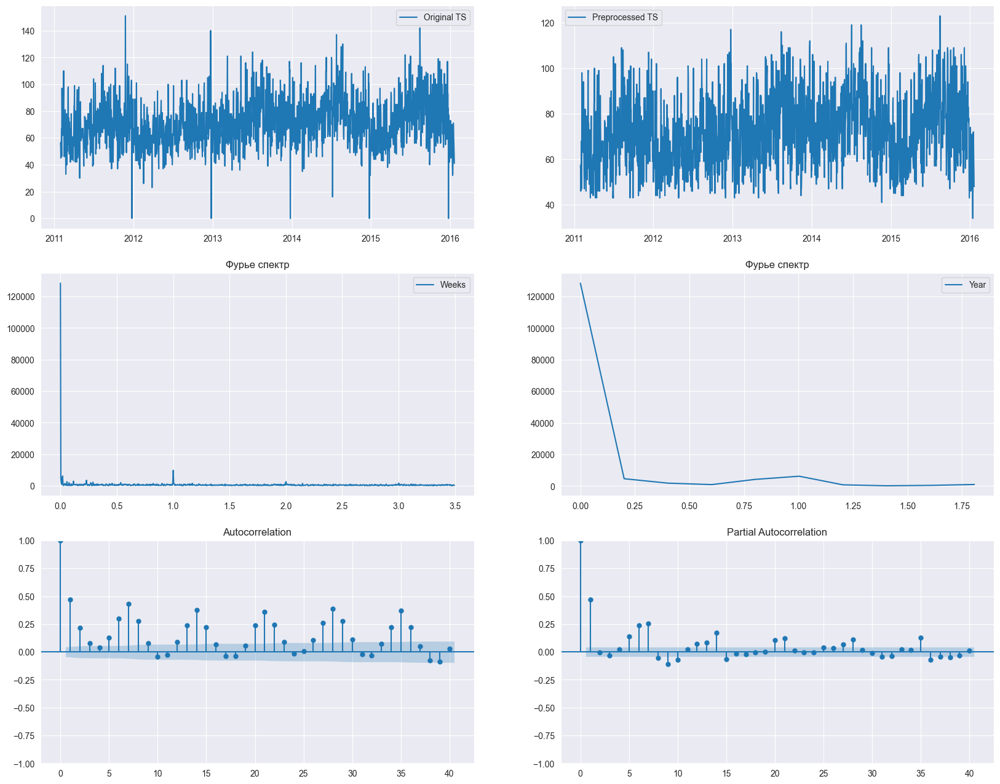

(True, 0.01, 4.495054479939156e-05)
Item: STORE_2_586
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 5}
0.0666141197150168
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 5}
0.05418534137147567
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 2.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 5}
0.07954390790769982


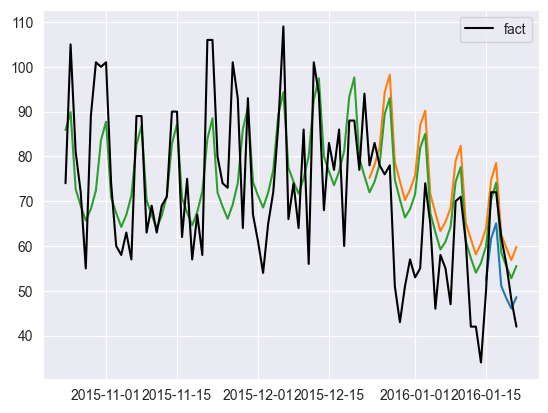

    mapes_mean  mapes_median
5    11.365119     13.646070
30   27.276991     23.007515
90   15.404693     10.923456
--------------Prophet trend + Fourier--------------


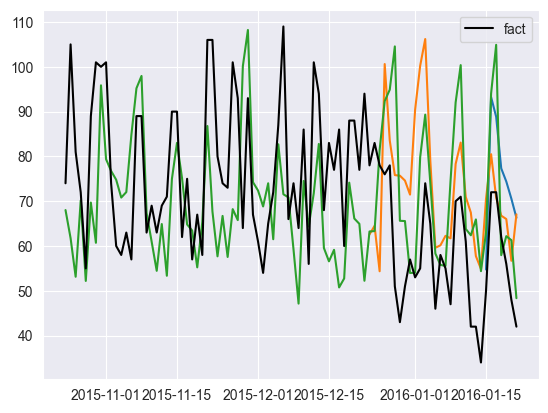

    mapes_mean  mapes_median
5    32.117469     29.505077
30   32.216523     27.474337
90   22.762180     19.428759
--------------Stl + Fourier + Arima--------------


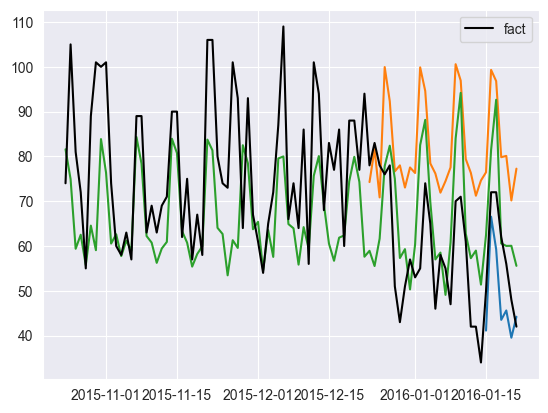

    mapes_mean  mapes_median
5    16.329510     17.683584
30   44.965314     40.497920
90   17.366625     15.056513
--------------Auto ets--------------


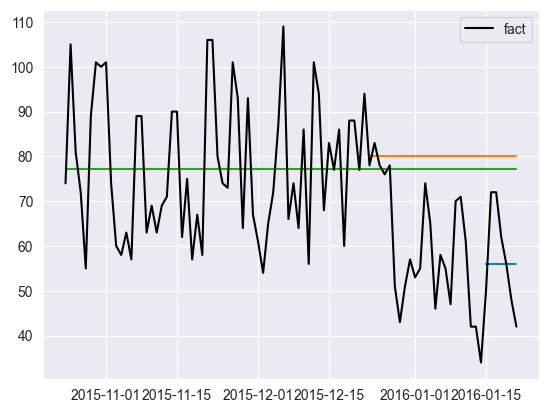

    mapes_mean  mapes_median
5    16.587677     16.607873
30   43.400781     41.763882
90   24.656081     18.627213


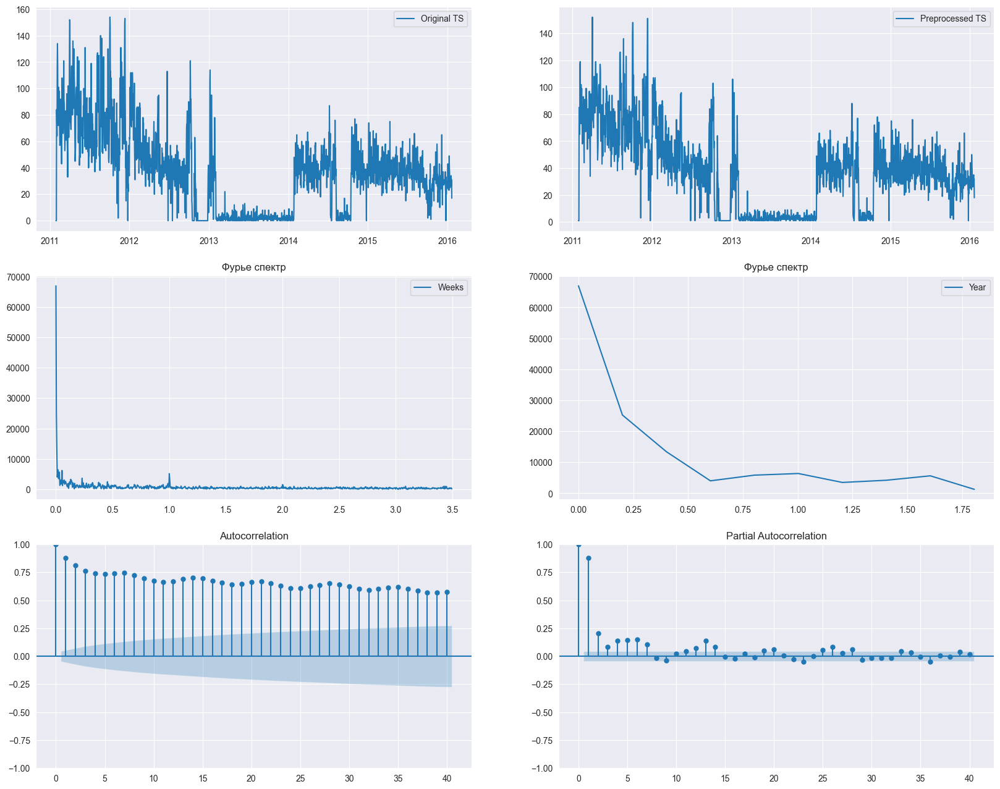

(True, 0.01, 0.0885594016149387)
Item: STORE_2_587
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 2.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
0.13862282517204078
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 20}
0.14219121083245562
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
0.16674745406357333


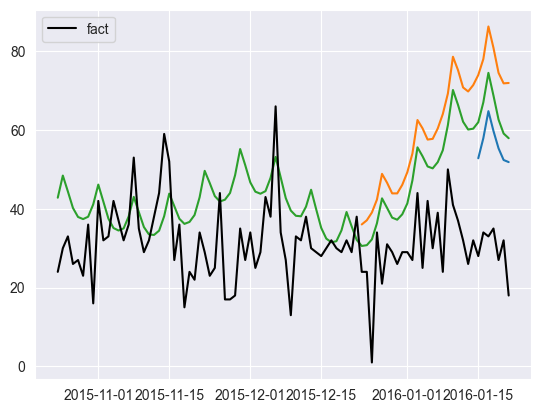

    mapes_mean  mapes_median
5    97.549456     88.659701
30  227.821623    101.671140
90   89.119957     37.504824
--------------Prophet trend + Fourier--------------


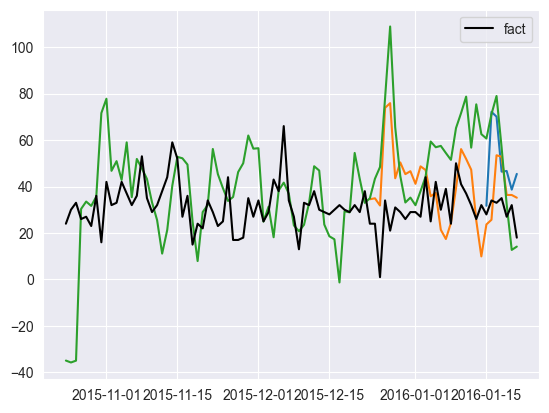

    mapes_mean  mapes_median
5    73.774439     72.922901
30  152.793082     43.584283
90  119.410858     50.442185
--------------Stl + Fourier + Arima--------------


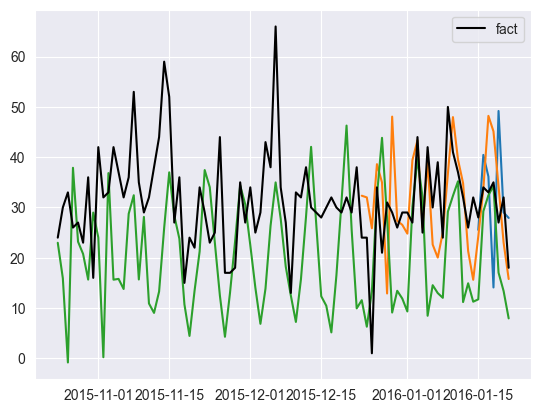

    mapes_mean  mapes_median
5    34.812454     18.989776
30  106.914756     21.284738
90   56.249074     44.794727
--------------Auto ets--------------


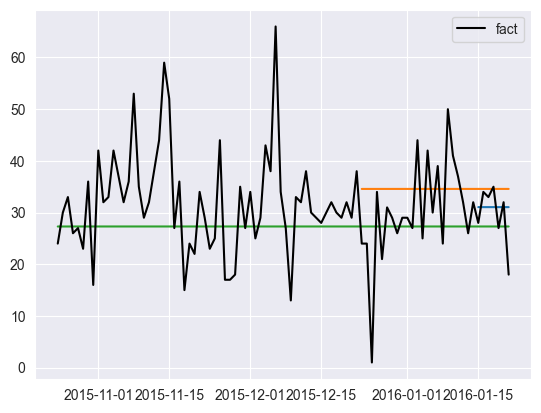

    mapes_mean  mapes_median
5    18.176241     10.909764
30  135.052735     19.223801
90   51.308561     17.242035


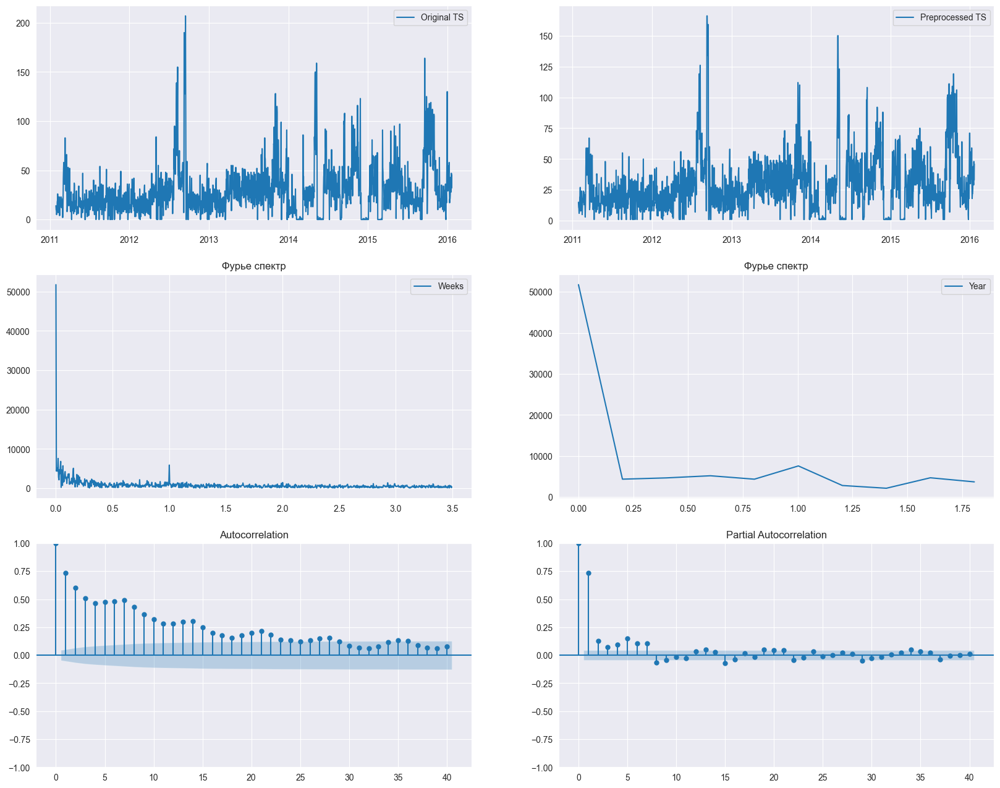

(True, 0.01, 2.988572353034294e-07)
Item: STORE_2_681
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 20}
0.12251309149459713
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 15}
0.169960569634299
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 5}
599126906506278.8


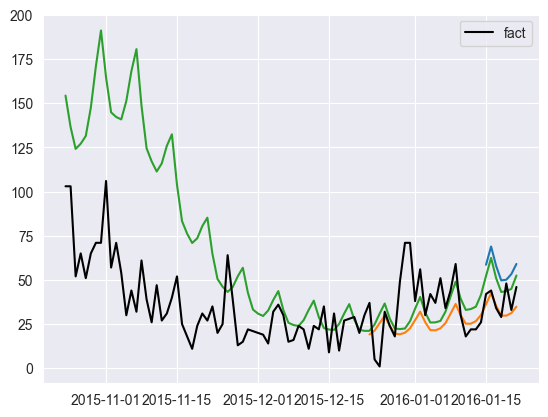

    mapes_mean  mapes_median
5    47.439201     56.608518
30  118.303380     26.595412
90  140.991448     58.263098
--------------Prophet trend + Fourier--------------


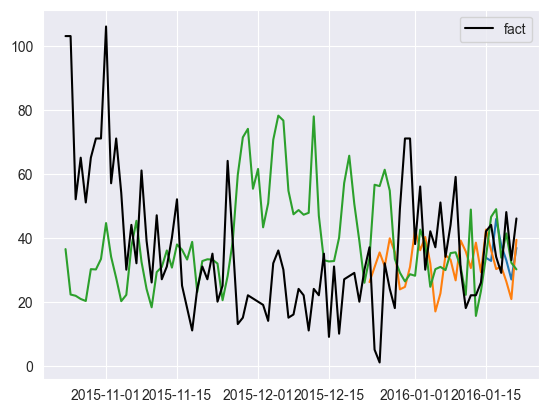

    mapes_mean  mapes_median
5    25.654613     25.597794
30  166.973531     36.283319
90  151.692561     53.314779
--------------Stl + Fourier + Arima--------------


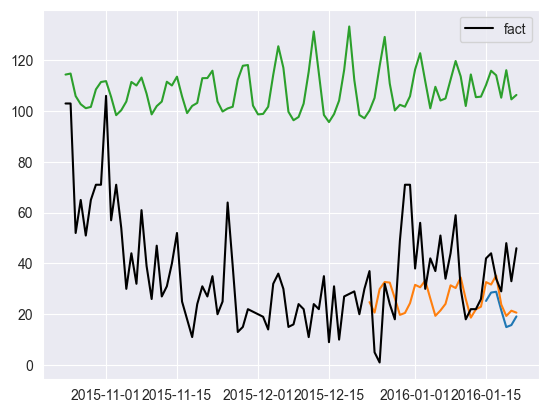

    mapes_mean  mapes_median
5    42.194100     39.917061
30  138.283281     35.224466
90  425.753061    252.958041
--------------Auto ets--------------


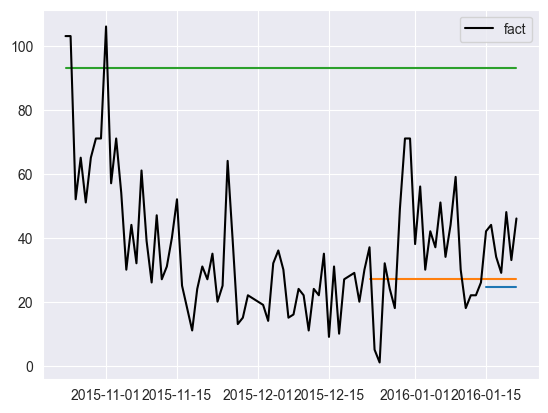

    mapes_mean  mapes_median
5    35.222383     41.102738
30  131.300609     35.798811
90  347.516413    200.334401


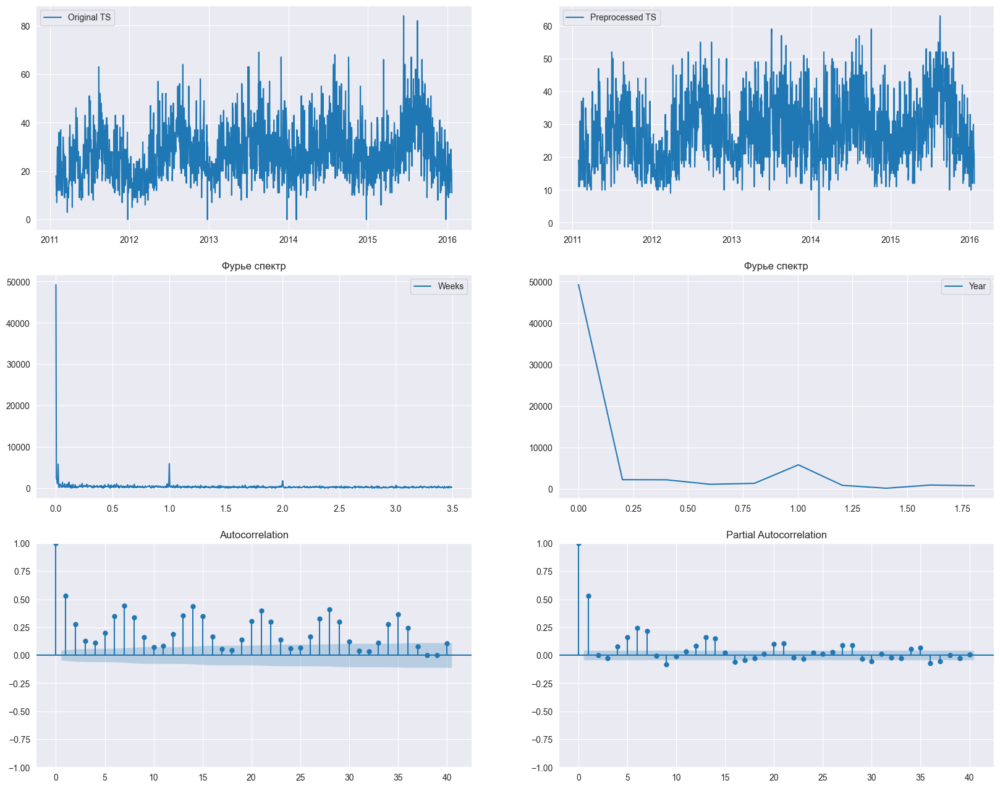

(True, 0.01, 0.0011698194732406287)
Item: STORE_2_714
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 15}
0.0902811426956312
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.05, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 20}
0.13031286211429366
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
0.1165968613358492


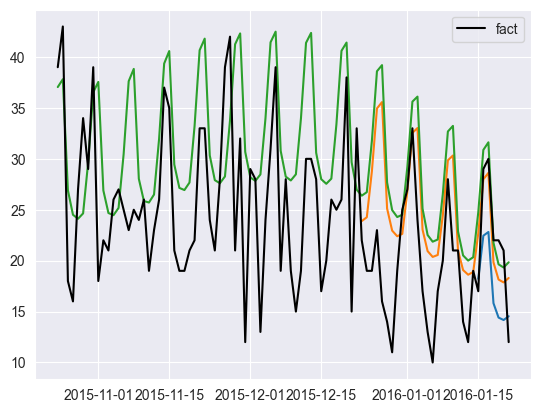

    mapes_mean  mapes_median
5    24.283808     23.946629
30   34.669968     24.982098
90   38.227778     30.819290
--------------Prophet trend + Fourier--------------


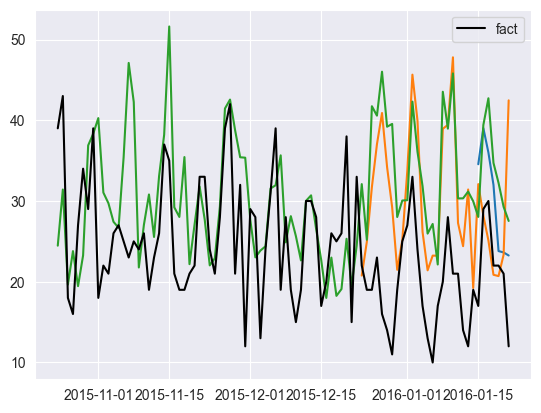

    mapes_mean  mapes_median
5    45.383759     34.573678
30   65.874049     47.419219
90   49.242417     33.404252
--------------Stl + Fourier + Arima--------------


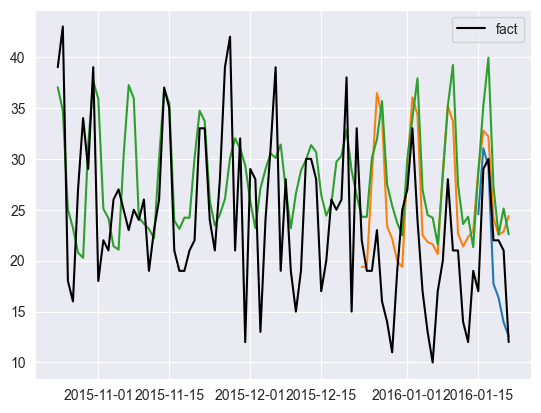

    mapes_mean  mapes_median
5    19.597034     19.462697
30   41.369007     29.023418
90   34.870323     21.789190
--------------Auto ets--------------


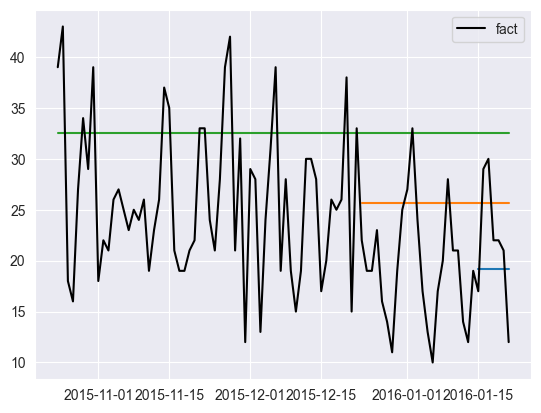

    mapes_mean  mapes_median
5    25.235242     13.045249
30   45.557735     31.847795
90   54.065765     41.475778


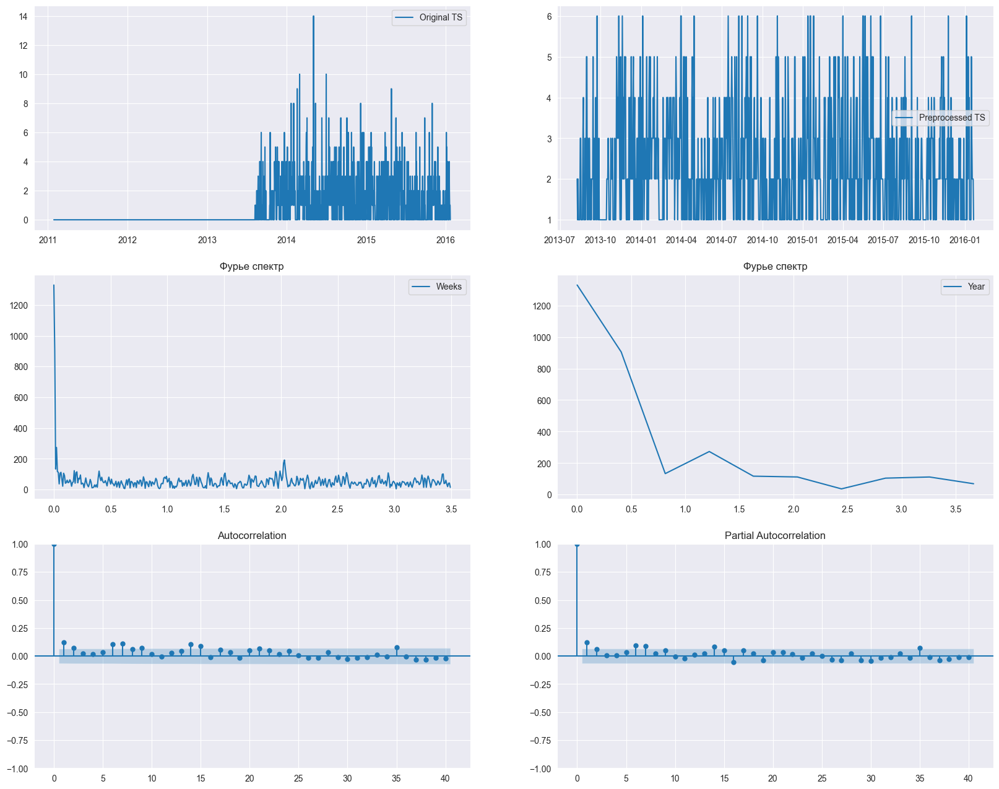

(False, 0.1, 1.3137806347737208e-14)
Item: STORE_2_716
--------------Prophet from box--------------
Fitting 9 folds for each of 32 candidates, totalling 288 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 15}
578521333044467.1
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1}
883687178589260.9
Fitting 7 folds for each of 32 candidates, totalling 224 fits
{'add_seasonality': {'name': 'weekly', 'period': 7, 'fourier_order': 5}, 'changepoint_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 15}
1546701457156432.8


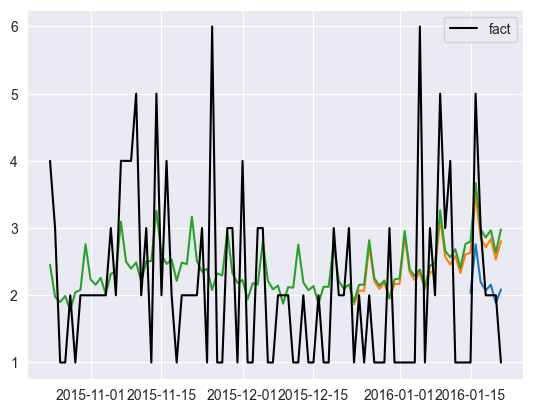

    mapes_mean  mapes_median
5    42.983114     26.796097
30   84.364057     96.417026
90   64.987165     38.501817
--------------Prophet trend + Fourier--------------


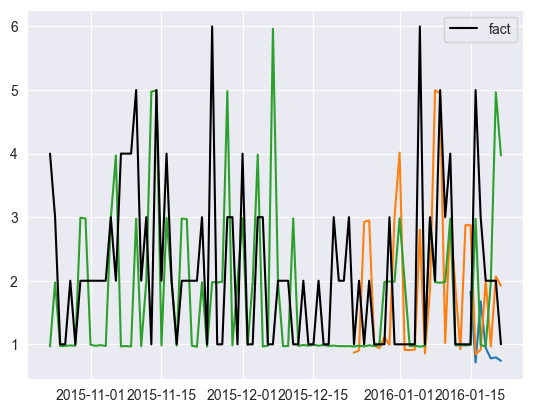

    mapes_mean  mapes_median
5    58.951995     60.268870
30   68.137489     49.559590
90   55.226153     49.955661
--------------Stl + Fourier + Arima--------------


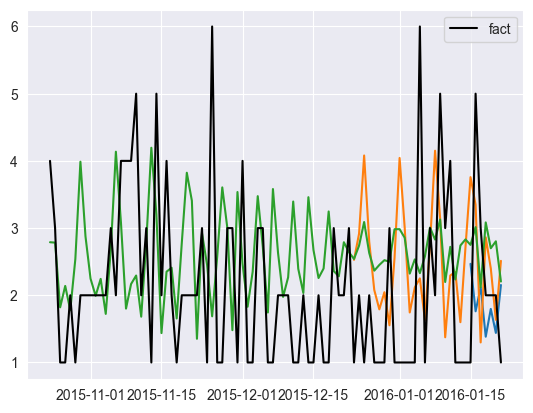

    mapes_mean  mapes_median
5    60.741915     30.817444
30  102.447068     68.808116
90   84.273303     48.222392
--------------Auto ets--------------


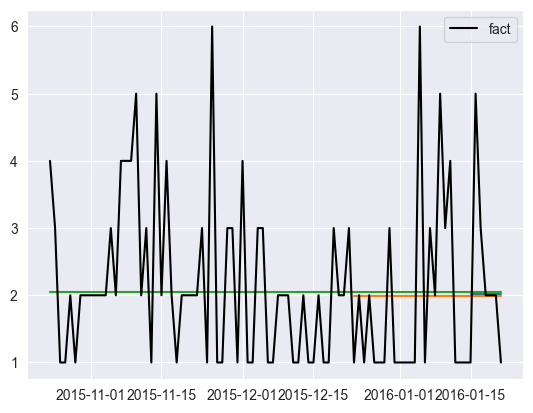

    mapes_mean  mapes_median
5    42.596636     32.789163
30   65.270931     98.905801
90   54.213647     48.858696


In [437]:
for name in tsp.items_names:
    tsp.run_pipeline(name)

Совокупный анализ.
1) Результаты первой модели - Prophet. Достаточно хорошо себя показывает, где есть чёткая недельная сезонность. Если сезонность представлена не одной компонентой( то есть несколько сезонностей, с разными амплитудами), то профет просто выделяет какую-то одну. Если применить бокса-кокса, то получатся чуть более лучшие результаты. 
2) Prophet Trend + furie. Если в качестве сезонности берёт  большую часть спектра после удаления тренда, то в случае отсутствия шумов и действительно неоднородной сезонности показывает хорошие результаты. По метрикам может быть хуже, чем prophet с кросс-валидацией, но зато видно, что прогноз повторяет динамику ряда. Причём по метрикам хуже, так как иногда входит в противофазу с настоящим рядом - это похоже на лик частоты, и может фиксится перебором параметров фурье-экстраполятора на кросс-валидации. 
3) STL + fourier + arima. STL изначально был заточен под выделение недельной сезонности. Хорошо справляется в случаях, когда нет дрифта тренда, так как ставил  наивный форексастер для трендовой комопненты. Лучше выделяет спектр, чем prophet, но если на длинном горизонте прогнозирования  произойдёт дрифт тренда, то результаты будут плохими, не смотря на хорошо описанную сезонность. Нормально подстраивается под динамику ряда (сезонная компоненты). На горизонте прогнозирования в 7 дней показывает лучшие резульаты по сравнению с вариациями prophet. Это объясняет тем, что за 7 дней не происходит изменение тренда, и при этом отрабатывает арма. Она на коротких промежутках прогнозирования даёт хорошие показатели
4) AutoETS - получается константый прогноз практически на всех рядах. Нормальная ситация, когда ряд очень шумный, нету выраженной  сезонности или ряд стационарный. 

Эти модели были выбраны после визаульного анализа. Ряды явно разделяются на ряд с дрифтующим трендом/постоянным трендом; одной сезонностью\целым спектром; с шумным спектром и без. Было бы тяжело по отдельности обрабатывать каждый ряд, и отдельно 
выбирать модель ещё и под горизонт прогноза. Очевидно, где-то можно было поставить арму, но она на горизонте в месяц или квартал просто бы сходилась к среднему ряда для стационарных случаев, например. Ещё пробовал как-то улчушать baseline_filter. Пробовал фильтр низких частот, чтобы от шума избавиться, но он давал только ухудшение точности. Также пробовал модель скользящего среднего с перебором параметров, она показывала себя как первый prophet